## ELM368 Project
### KEDİ İLE KÖPEK SESLERİ ARASINDA FREKANS ANALİZİ İLE TESPİT YAPILMASI

***
### Berat KIZILARMUT - 171024086
### Ömer Emre POLAT - 1801022037

***

## Table of Contents:
* [Prep Phase](#Prep)
* [Low Pass Filter](#LPF)
* [Band Pass Filter](#BPF)
* [Analyzing Each Sample](#Analyze)
    * [Sample1](#Sample1)
    * [Sample1 Filter](#Sample1F)
    * [Sample2](#Sample2)
    * [Sample2 Filter](#Sample2F)
    * [Sample3](#Sample3)
    * [Sample3 Filter](#Sample3F)
    * [Sample4](#Sample4)
    * [Sample4 Filter](#Sample4F)
    * [Sample5](#Sample5)
    * [Sample5 Filter](#Sample5F)
    * [Sample6](#Sample6)
    * [Sample6 Filter](#Sample6F)
* [Decision Algorithm](#Algorithm)


***

## Prep Phase<a class="anchor" id="Prep"></a>

In [1]:
# Kütüphane importlanması
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sgnl
from scipy.fftpack import fft, ifft
from scipy.io import loadmat
from scipy.io.wavfile import read
from IPython.lib.display import Audio
%matplotlib notebook
# plot fonksiyonu için figür boyutu ayarlanması
plt.rcParams['figure.figsize'] = [10, 5]
plt.rcParams.update({'figure.max_open_warning': 0})

In [2]:
index = 0 # seçilen örnek değişkeni
# Hesaplarda gerekecek değişkenlerin dizi biçiminde tanımlanması
xn = np.empty([6], dtype=np.ndarray) # sinyallerin kendileri
Fs = np.empty([6]) # örnekleme frekansları
N = np.empty([6]) # örnek sayıları
n = np.empty([6], dtype=np.ndarray) # örnek indisi
w = np.empty([6], dtype=np.ndarray) # açısal frekans indisi
wf = np.empty([6], dtype=np.ndarray) # frekans indisi
xw = np.empty([6], dtype=np.ndarray) # fourier dönüşümü

xn_LPF = np.empty([6], dtype=np.ndarray) # sinyallerin agf ile filtrelenmiş halleri
xw_LPF = np.empty([6], dtype=np.ndarray) # fourier dönüşümü

xn_BPF = np.empty([6], dtype=np.ndarray) # sinyallerin bgf filtrelenmiş halleri
xw_BPF = np.empty([6], dtype=np.ndarray) # fourier dönüşümü

# Ortalama değerlerinin depolanacağı değişkenlerin dizi biçiminde tanımlanması
NAvg = np.empty([6], dtype=int) # örnek sayısı
MagAvg = np.empty([6]) # genlik değerleri
FreqAvg = np.empty([6]) # frekans değerleri

NAvg_LPF = np.empty([6], dtype=int) # örnek sayısı
MagAvg_LPF = np.empty([6]) # genlik değerleri
FreqAvg_LPF = np.empty([6]) # frekans değerleri

NAvg_BPF = np.empty([6], dtype=int) # örnek sayısı
MagAvg_BPF = np.empty([6]) # genlik değerleri
FreqAvg_BPF = np.empty([6]) # frekans değerleri

***

## Low Pass Filter, $f_c = 1000 Hz$ <a class="anchor" id="LPF"></a>

In [3]:
# pyFDA'de tasarlanmış olan Low Pass Filter'ın verisinin çağırılması
LPF_data = loadmat('A19_LPF.mat') # LPF verisinin açılması
Coeffs = LPF_data['ba'].astype(float) # veriden değişkenlerin çekilmesi

LPFb = Coeffs[0] # değişkenlerin içinden b' verisinin çekilmesi
LPFa = np.zeros(len(LPFb)) # FIR filtre olduğu için a verisinin b uzunluğunda boş tanımlanması
LPFa[0] = 1 # dizinin sadece ilk değerine 1 atanması

<IPython.core.display.Javascript object>


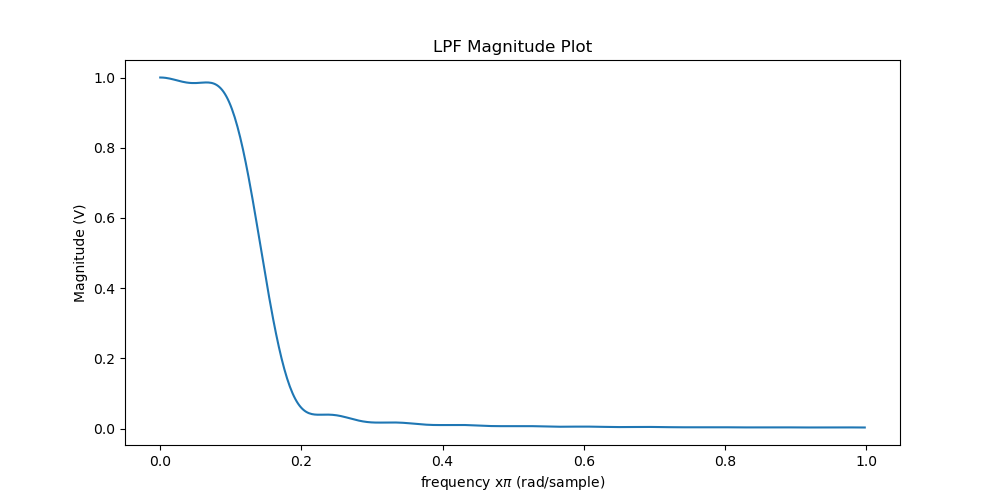

<IPython.core.display.Javascript object>


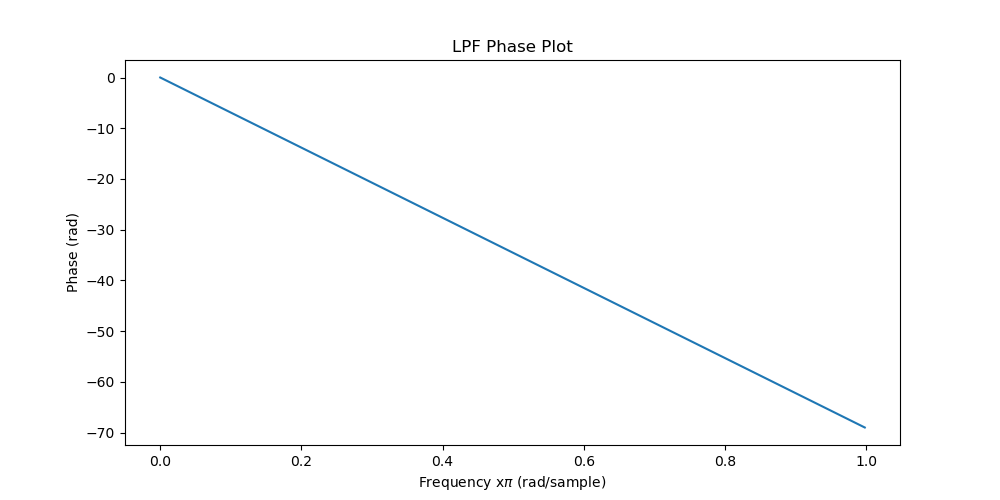

<IPython.core.display.Javascript object>


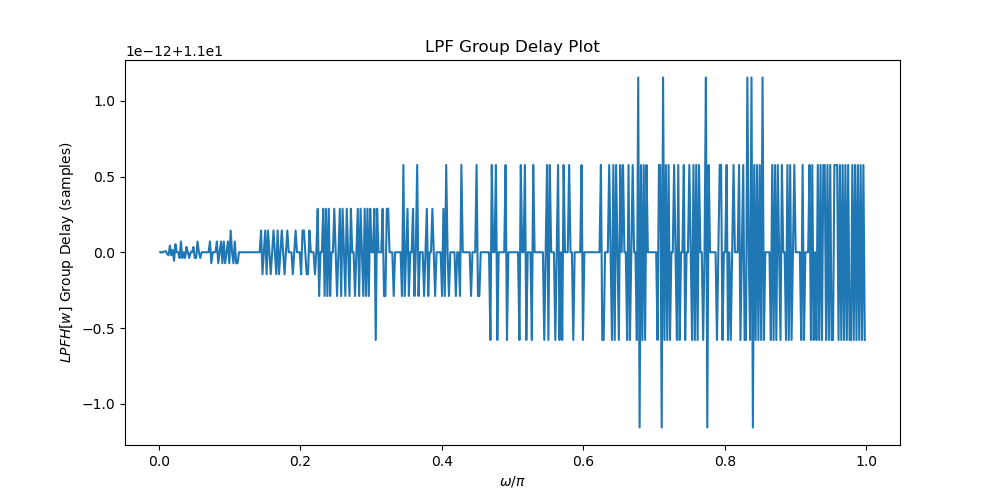

In [4]:
LPFw, LPFHw = sgnl.freqz(LPFb,LPFa) # b ve a değişkenlerinden freqz fonskiyonu ile transfer fonksiyonlarının çekilmesi

# genlik grafiğinin çizdirilmesi
plt.figure() 
plt.plot(LPFw/np.pi, np.abs(LPFHw))
plt.title('LPF Magnitude Plot')
plt.ylabel('Magnitude (V)')
plt.xlabel('frequency x$\pi$ (rad/sample)')

# faz grafiğinin çizdirilmesi
plt.figure()
plt.plot(LPFw/np.pi, np.unwrap(np.angle(LPFHw)))
plt.title('LPF Phase Plot')
plt.ylabel('Phase (rad)')
plt.xlabel('Frequency x$\pi$ (rad/sample)')

LPFtau = -np.diff(np.unwrap(np.angle(LPFHw)))*(len(LPFHw)/(2*np.pi)) # grup gecikmesinin hesaplanması

# grup gecikmesi grafiğinin çizdirilmesi
plt.figure()
plt.plot(LPFw[1:]/np.pi, LPFtau)
plt.title('LPF Group Delay Plot')
plt.ylabel('$LPF H[w]$ Group Delay (samples)')
plt.xlabel('$\omega/{\pi}$')
plt.show()

***

## Band Pass Filter, $f_{c1} = 1000 Hz$, $f_{c2} = 6000 Hz$ <a class="anchor" id="BPF"></a>

In [5]:
# pyFDA'de tasarlanmış olan Band Pass Filter'ın verisinin çağırılması
BPF_data = loadmat('A19_BPF.mat') # BPF verisinin açılması

Coeffs = BPF_data['ba'].astype(float) # veriden değişkenlerin çekilmesi

BPFb = Coeffs[0] # değişkenlerin içinden b' verisinin çekilmesi
BPFa = np.zeros(len(BPFb)) # FIR filtre olduğu için a verisinin b uzunluğunda boş tanımlanması
BPFa[0] = 1 # dizinin sadece ilk değerine 1 atanması

<IPython.core.display.Javascript object>


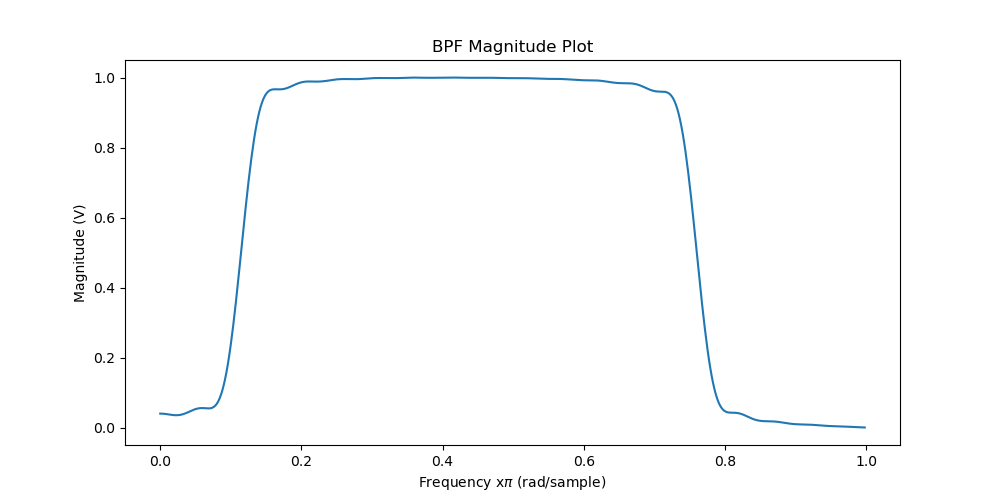

<IPython.core.display.Javascript object>


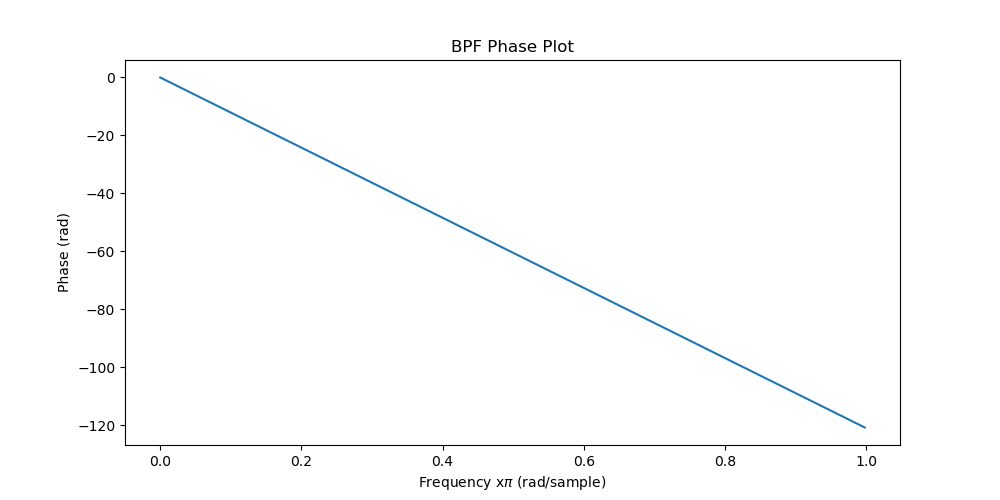

<IPython.core.display.Javascript object>


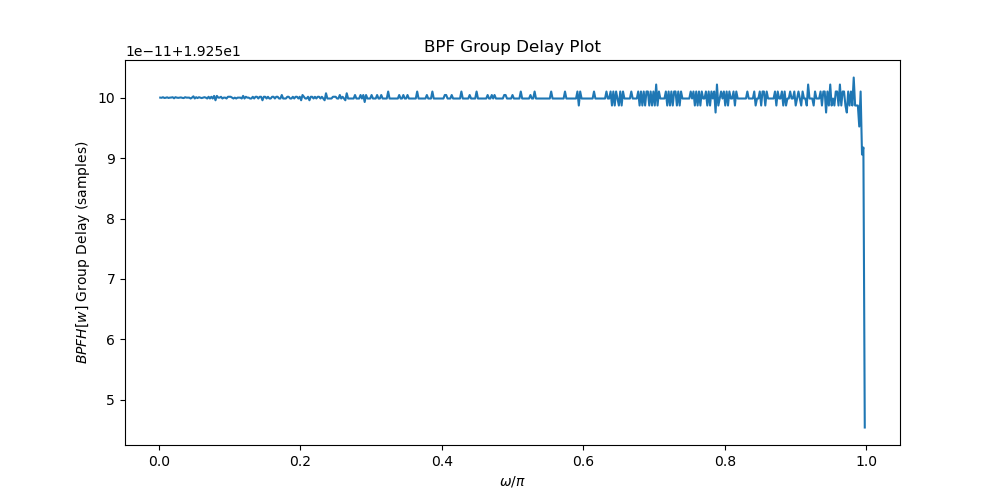

In [6]:
BPFw, BPFHw = sgnl.freqz(BPFb,BPFa) # b ve a değişkenlerinden freqz fonskiyonu ile transfer fonksiyonlarının çekilmesi

# genlik grafiğinin çizdirilmesi
plt.figure()
plt.plot(BPFw/np.pi, np.abs(BPFHw))
plt.title('BPF Magnitude Plot')
plt.ylabel('Magnitude (V)')
plt.xlabel('Frequency x$\pi$ (rad/sample)')

# faz grafiğinin çizdirilmesi
plt.figure()
plt.plot(BPFw/np.pi, np.unwrap(np.angle(BPFHw)))
plt.title('BPF Phase Plot')
plt.ylabel('Phase (rad)')
plt.xlabel('Frequency x$\pi$ (rad/sample)')

BPFtau = -np.diff(np.unwrap(np.angle(BPFHw)))*(len(BPFHw)/(2*np.pi)) # grup gecikmesinin hesaplanması

# grup gecikmesi grafiğinin çizdirilmesi
plt.figure()
plt.plot(BPFw[1:]/np.pi, BPFtau)
plt.title('BPF Group Delay Plot')
plt.ylabel('$BPF H[w]$ Group Delay (samples)')
plt.xlabel('$\omega/{\pi}$')
plt.show()

***

# Analyzing Each Sample <a class="anchor" id="Analyze"></a>

***

## Sample1 <a class="anchor" id="Sample1"></a>

Sample1 Signal


<IPython.core.display.Javascript object>


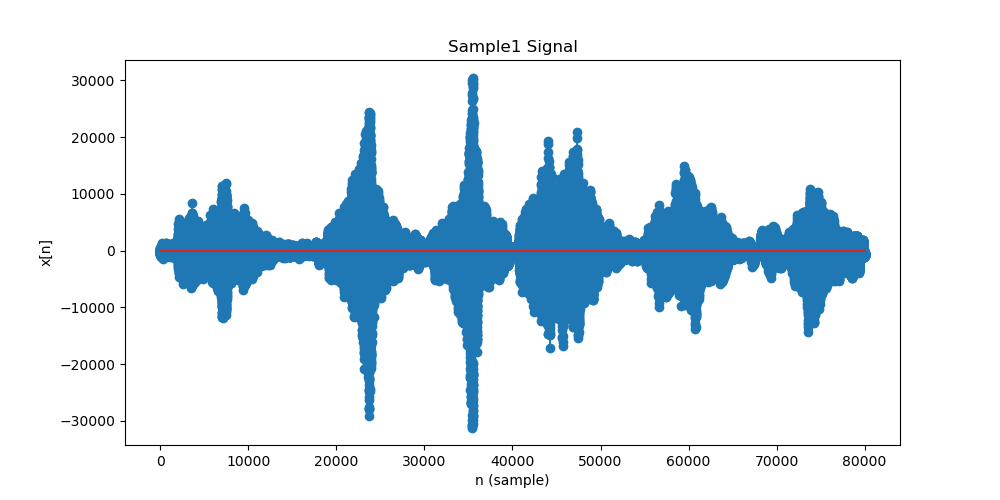

Text(0, 0.5, 'x[n]')

In [7]:
index = 0
Fs[index], xn[index] = read("A19_Sample1.wav") # sinyal verisinin çekilmesi
N[index] = len(xn[index]) # örnek sayısının atanması
n[index] = np.arange(0,N[index]) # örnek indisinin atanması

# sinyalin dinlenebilmesi için ses oynatıcısı oluşturulması
print('Sample1 Signal')
display(Audio(xn[index], rate=Fs[index]))

# sinyalin çizdirilmesi
plt.figure()
plt.stem(n[index], xn[index], use_line_collection=True)
plt.title("Sample1 Signal")
plt.xlabel("n (sample)")
plt.ylabel("x[n]")

<IPython.core.display.Javascript object>


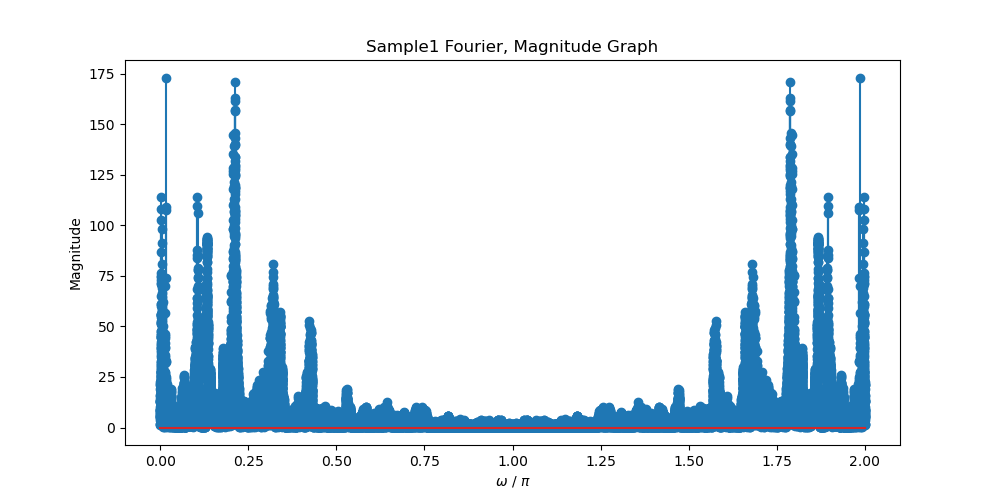

<IPython.core.display.Javascript object>


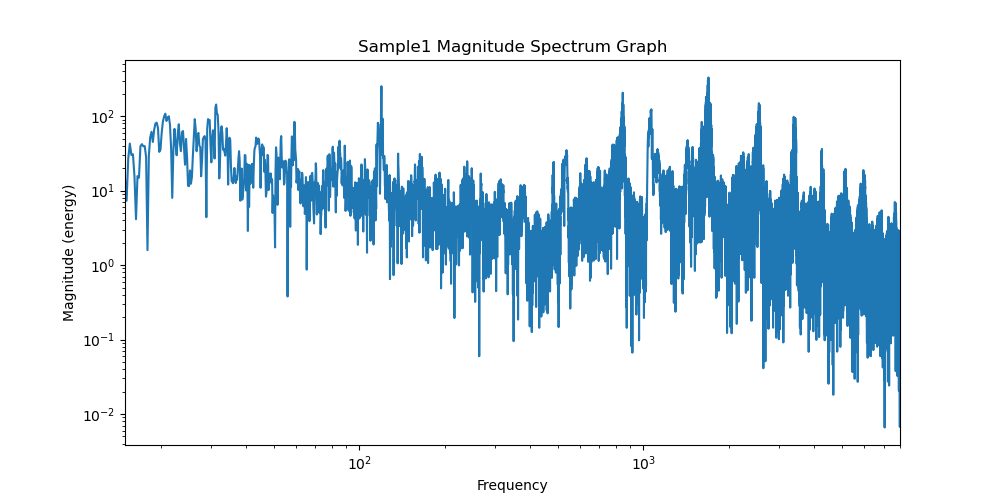

(15, 8000)

In [8]:
w[index] = np.arange(0, 2*np.pi, 2*np.pi/(N[index])) # açısal frekans indisinin hesaplanması
wf[index] = w[index]/np.pi*Fs[index]/2 # frekans indisinin hesaplanması
xw[index] = (np.fft.fft(xn[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.stem((w[index]/np.pi), abs(xw[index]), use_line_collection=True)
plt.title('Sample1 Fourier, Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.magnitude_spectrum(xn[index], Fs=Fs[index])
plt.title('Sample1 Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)

<IPython.core.display.Javascript object>


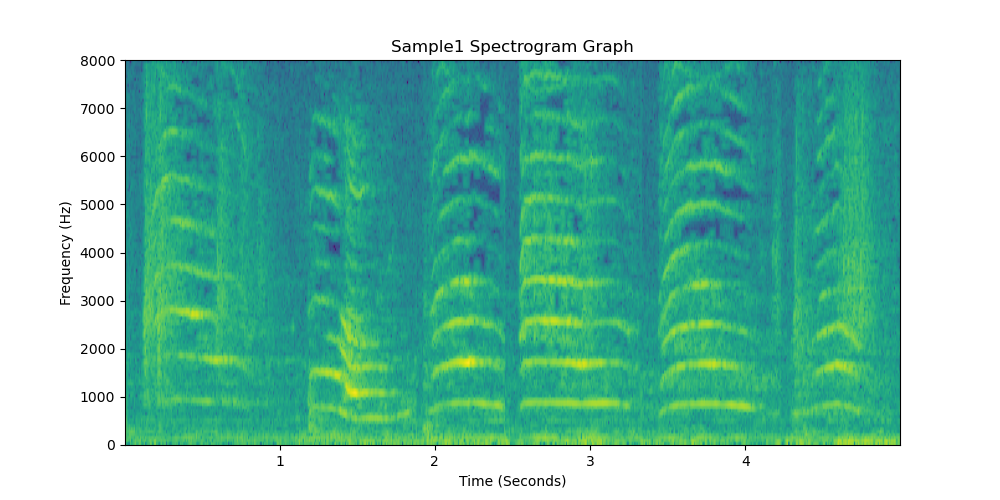

Text(0, 0.5, 'Frequency (Hz)')

In [9]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.specgram(xn[index],  Fs=int(Fs[index]))
plt.title('Sample1 Spectrogram Graph')
plt.xlabel('Time (Seconds)')
plt.ylabel('Frequency (Hz)')

In [10]:
NAvg[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg[index] = np.average(wf[index][:NAvg[index]], weights=abs(xw[index][:NAvg[index]])) # ağırlıklı ortalama frekans hesaplanması
print("Average Weighted Frequency: %5.2f" % (FreqAvg[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg[index] = np.average(abs(xw[index][:NAvg[index]])) # ortalama genlik hesaplanması
print("Average Magnitude: %5.2f" % (MagAvg[index])) # ortalama genlik değerinin yazdırılması

Average Weighted Frequency: 2382.37
Average Magnitude:  6.02


***

## Sample1 için Filtreleme İşlemleri <a class="anchor" id="Sample1F"></a>

<IPython.core.display.Javascript object>


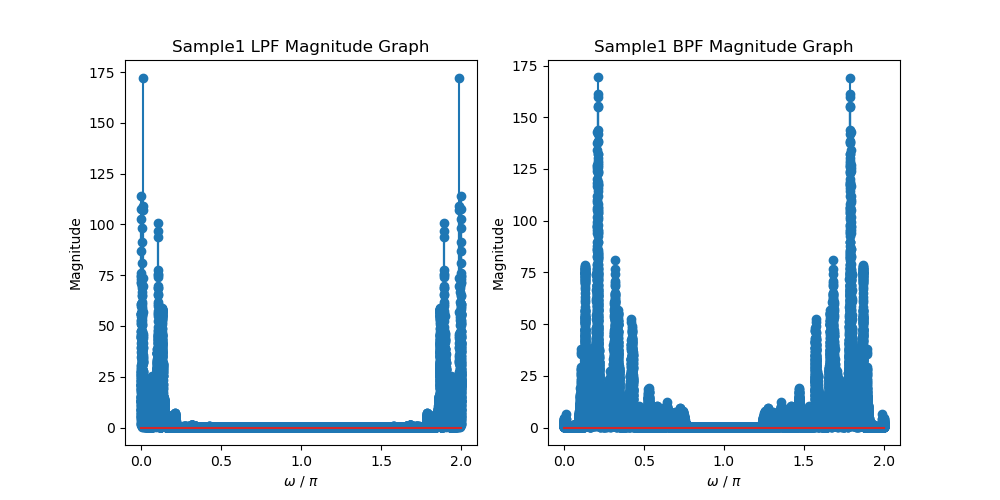

<IPython.core.display.Javascript object>


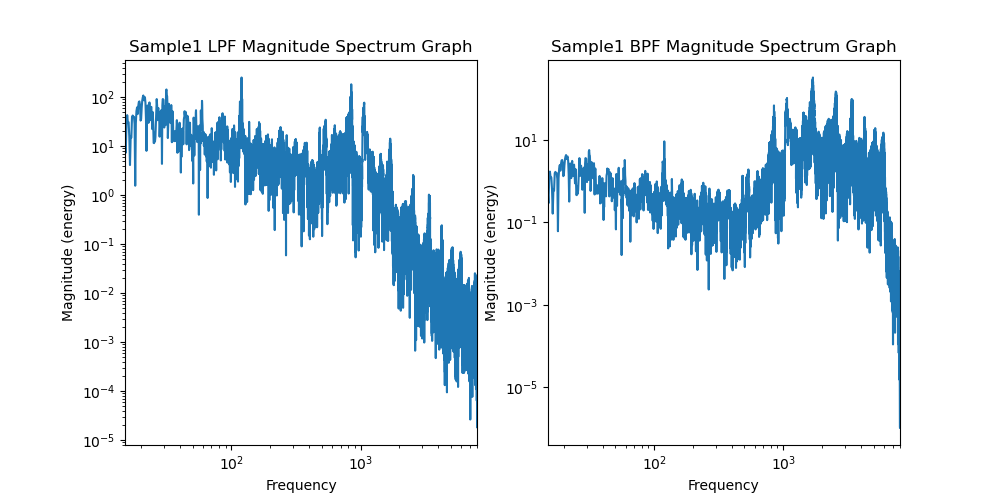

In [11]:
# işarete alçak geçiren filtrenin uygulanması
xn_LPF[index] = sgnl.lfilter(LPFb, LPFa, xn[index])
xw_LPF[index] = (np.fft.fft(xn_LPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# işarete bant geçiren filtrenin uygulanması
xn_BPF[index] = sgnl.lfilter(BPFb, BPFa, xn[index])
xw_BPF[index] = (np.fft.fft(xn_BPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.stem((w[index]/np.pi), abs(xw_LPF[index]), use_line_collection=True)
plt.title('Sample1 LPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.subplot(1,2,2)
plt.stem((w[index]/np.pi), abs(xw_BPF[index]), use_line_collection=True)
plt.title('Sample1 BPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.show()

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.magnitude_spectrum(xn_LPF[index], Fs=Fs[index])
plt.title('Sample1 LPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.subplot(1,2,2)
plt.magnitude_spectrum(xn_BPF[index], Fs=Fs[index])
plt.title('Sample1 BPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.show()

<IPython.core.display.Javascript object>


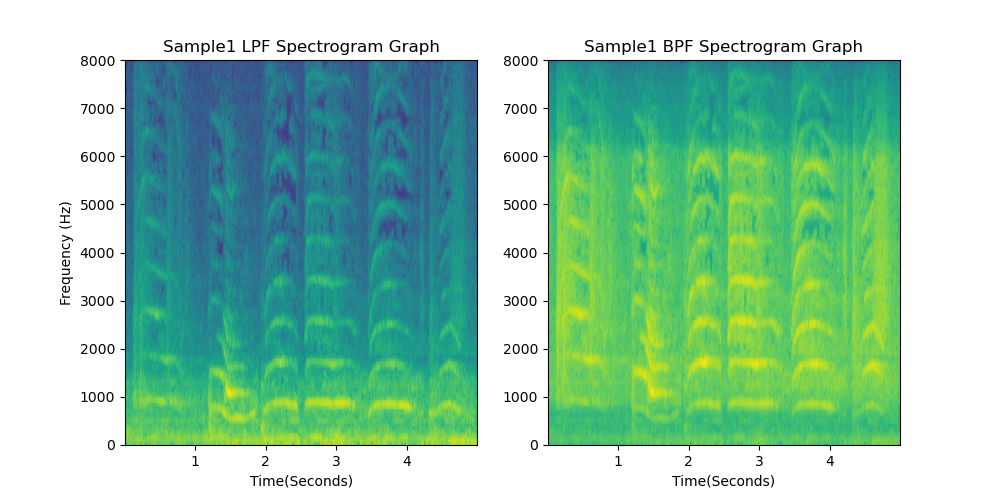

In [12]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.specgram(xn_LPF[index], Fs=int(Fs[index]))
plt.title('Sample1 LPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')
plt.subplot(1,2,2)
plt.specgram(xn_BPF[index], Fs=int(Fs[index]))
plt.title('Sample1 BPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.show()

In [13]:
NAvg_LPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_LPF[index] = np.average(wf[index][:NAvg_LPF[index]], weights=abs(xw_LPF[index][:NAvg_LPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("LPF Average Weighted Frequency: %5.2f" % (FreqAvg_LPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

NAvg_BPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_BPF[index] = np.average(wf[index][:NAvg_BPF[index]], weights=abs(xw_BPF[index][:NAvg_BPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("BPF Average Weighted Frequency: %5.2f" % (FreqAvg_BPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg_LPF[index] = np.average(abs(xw_LPF[index][:NAvg_LPF[index]])) # ortalama genlik hesaplanması
print("LPF Average Magnitude: %5.2f" % (MagAvg_LPF[index])) # ortalama genlik değerinin yazdırılması

MagAvg_BPF[index] = np.average(abs(xw_BPF[index][:NAvg_BPF[index]])) # ortalama genlik hesaplanması
print("BPF Average Magnitude: %5.2f" % (MagAvg_BPF[index])) # ortalama genlik değerinin yazdırılması

LPF Average Weighted Frequency: 737.71
BPF Average Weighted Frequency: 2530.55
LPF Average Magnitude:  1.51
BPF Average Magnitude:  4.71


***

## Sample2 <a class="anchor" id="Sample2"></a>

Sample2 Signal


<IPython.core.display.Javascript object>


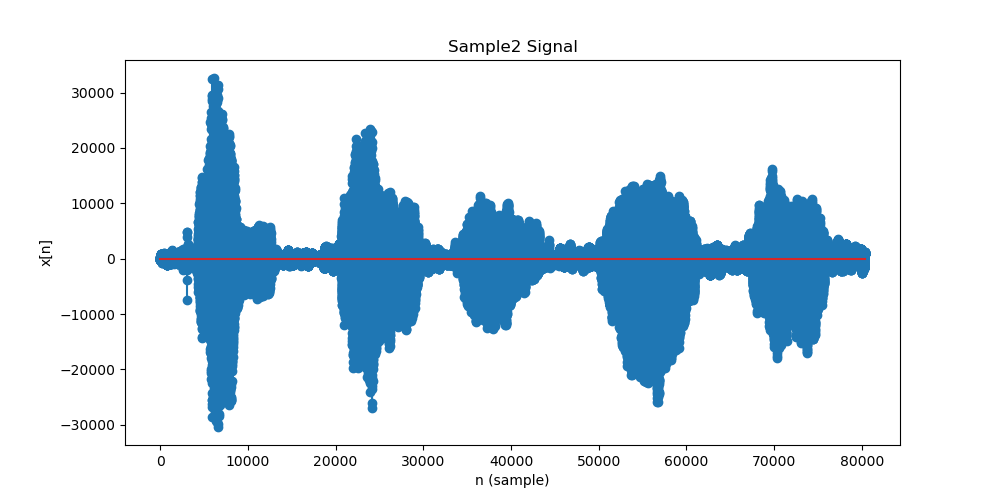

Text(0, 0.5, 'x[n]')

In [14]:
index = 1
Fs[index], xn[index] = read("A19_Sample2.wav") # sinyal verisinin çekilmesi
N[index] = len(xn[index]) # örnek sayısının atanması
n[index] = np.arange(0,N[index]) # örnek indisinin atanması

# sinyalin dinlenebilmesi için ses oynatıcısı oluşturulması
print('Sample2 Signal')
display(Audio(xn[index], rate=Fs[index]))

# sinyalin çizdirilmesi
plt.figure()
plt.stem(n[index], xn[index], use_line_collection=True)
plt.title("Sample2 Signal")
plt.xlabel("n (sample)")
plt.ylabel("x[n]")

<IPython.core.display.Javascript object>


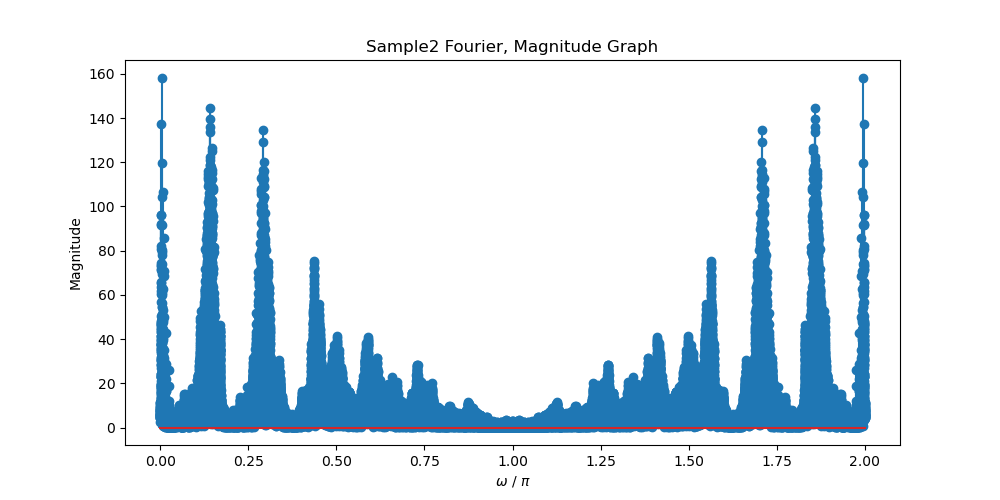

<IPython.core.display.Javascript object>


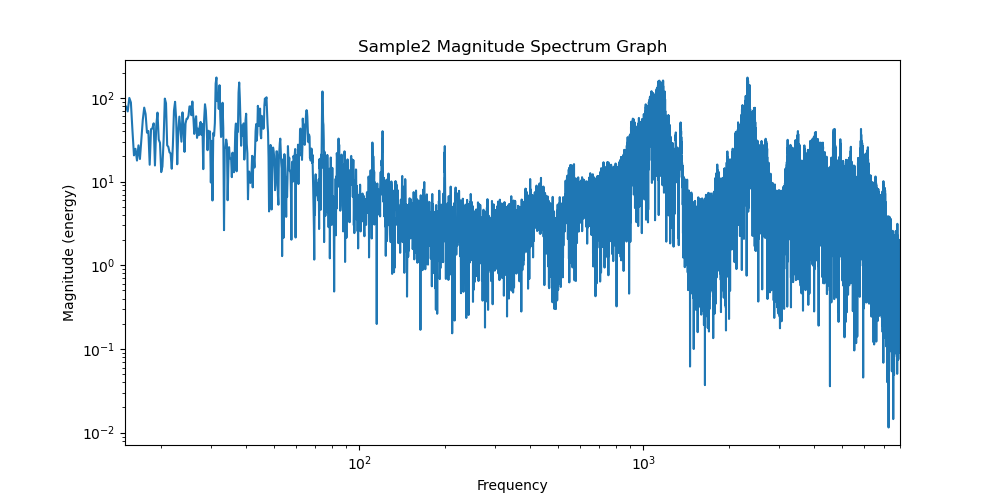

(15, 8000)

In [15]:
w[index] = np.arange(0, 2*np.pi, 2*np.pi/(N[index])) # açısal frekans indisinin hesaplanması
wf[index] = w[index]/np.pi*Fs[index]/2 # frekans indisinin hesaplanması
xw[index] = (np.fft.fft(xn[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.stem((w[index]/np.pi), abs(xw[index]), use_line_collection=True)
plt.title('Sample2 Fourier, Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.magnitude_spectrum(xn[index], Fs=Fs[index])
plt.title('Sample2 Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)

<IPython.core.display.Javascript object>


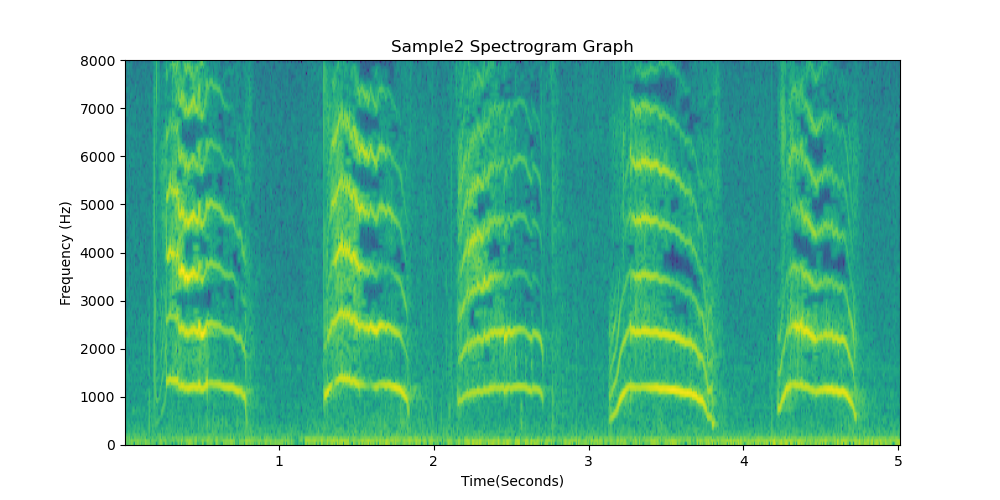

Text(0, 0.5, 'Frequency (Hz)')

In [16]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.specgram(xn[index],  Fs=int(Fs[index]))
plt.title('Sample2 Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')

In [17]:
NAvg[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg[index] = np.average(wf[index][:NAvg[index]], weights=abs(xw[index][:NAvg[index]])) # ağırlıklı ortalama frekans hesaplanması
print("Average Weighted Frequency: %5.2f" % (FreqAvg[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg[index] = np.average(abs(xw[index][:NAvg[index]])) # ortalama genlik hesaplanması
print("Average Magnitude: %5.2f" % (MagAvg[index])) # ortalama genlik değerinin yazdırılması

Average Weighted Frequency: 3026.58
Average Magnitude:  9.83


***

## Sample2 için Filtreleme İşlemleri <a class="anchor" id="Sample2F"></a>

<IPython.core.display.Javascript object>


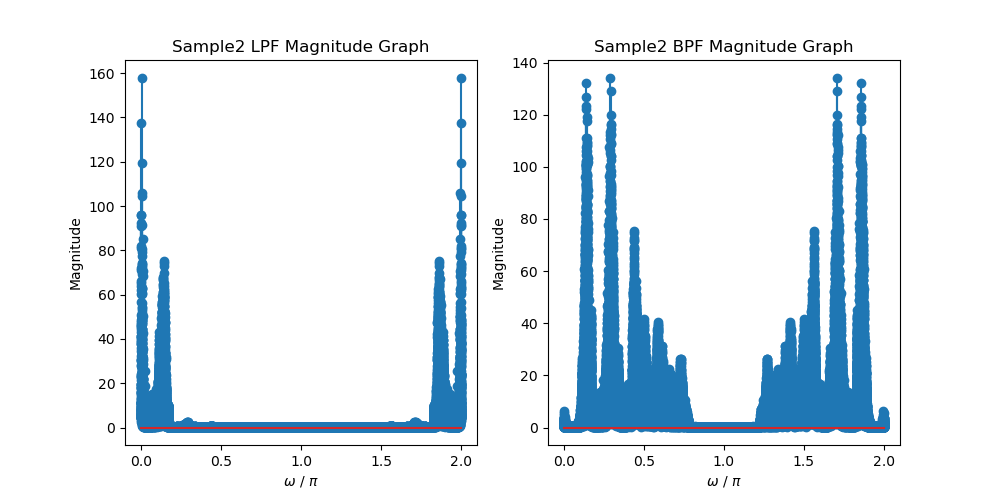

<IPython.core.display.Javascript object>


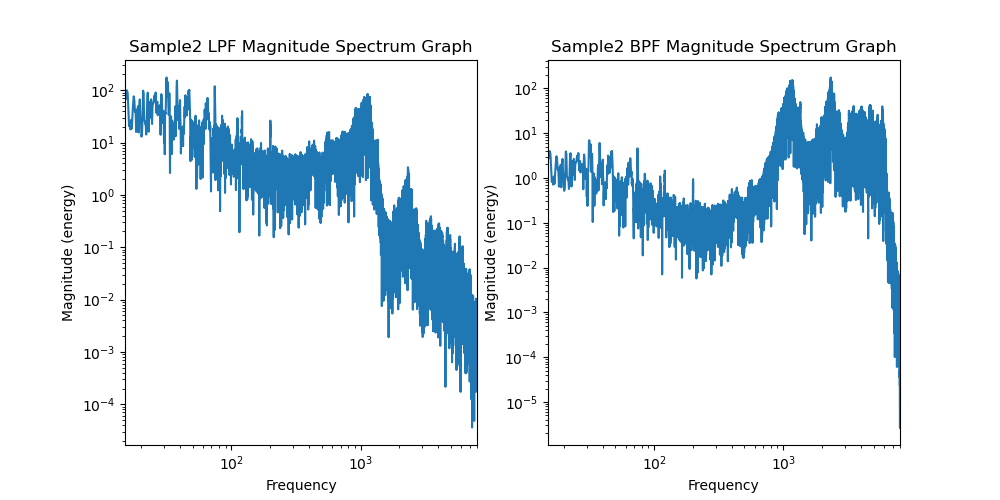

In [18]:
# işarete alçak geçiren filtrenin uygulanması
xn_LPF[index] = sgnl.lfilter(LPFb, LPFa, xn[index])
xw_LPF[index] = (np.fft.fft(xn_LPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# işarete bant geçiren filtrenin uygulanması
xn_BPF[index] = sgnl.lfilter(BPFb, BPFa, xn[index])
xw_BPF[index] = (np.fft.fft(xn_BPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.stem((w[index]/np.pi), abs(xw_LPF[index]), use_line_collection=True)
plt.title('Sample2 LPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.subplot(1,2,2)
plt.stem((w[index]/np.pi), abs(xw_BPF[index]), use_line_collection=True)
plt.title('Sample2 BPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.show()

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.magnitude_spectrum(xn_LPF[index], Fs=Fs[index])
plt.title('Sample2 LPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.subplot(1,2,2)
plt.magnitude_spectrum(xn_BPF[index], Fs=Fs[index])
plt.title('Sample2 BPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.show()

<IPython.core.display.Javascript object>


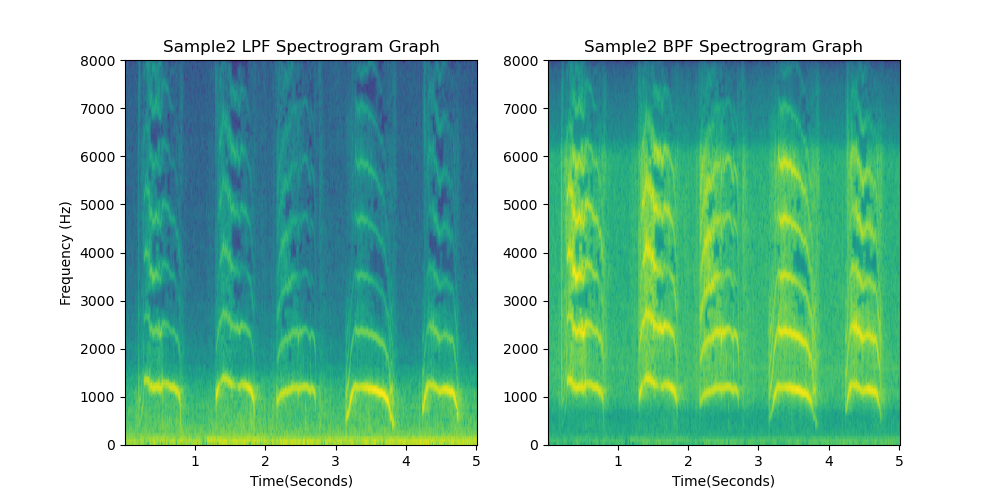

In [19]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.specgram(xn_LPF[index], Fs=int(Fs[index]))
plt.title('Sample2 LPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')
plt.subplot(1,2,2)
plt.specgram(xn_BPF[index], Fs=int(Fs[index]))
plt.title('Sample2 BPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.show()

In [20]:
NAvg_LPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_LPF[index] = np.average(wf[index][:NAvg_LPF[index]], weights=abs(xw_LPF[index][:NAvg_LPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("LPF Average Weighted Frequency: %5.2f" % (FreqAvg_LPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

NAvg_BPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_BPF[index] = np.average(wf[index][:NAvg_BPF[index]], weights=abs(xw_BPF[index][:NAvg_BPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("BPF Average Weighted Frequency: %5.2f" % (FreqAvg_BPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg_LPF[index] = np.average(abs(xw_LPF[index][:NAvg_LPF[index]])) # ortalama genlik hesaplanması
print("LPF Average Magnitude: %5.2f" % (MagAvg_LPF[index])) # ortalama genlik değerinin yazdırılması

MagAvg_BPF[index] = np.average(abs(xw_BPF[index][:NAvg_BPF[index]])) # ortalama genlik hesaplanması
print("BPF Average Magnitude: %5.2f" % (MagAvg_BPF[index])) # ortalama genlik değerinin yazdırılması

LPF Average Weighted Frequency: 899.00
BPF Average Weighted Frequency: 3018.29
LPF Average Magnitude:  1.95
BPF Average Magnitude:  8.11


***

## Sample3 <a class="anchor" id="Sample3"></a>

Sample3 Signal


<IPython.core.display.Javascript object>


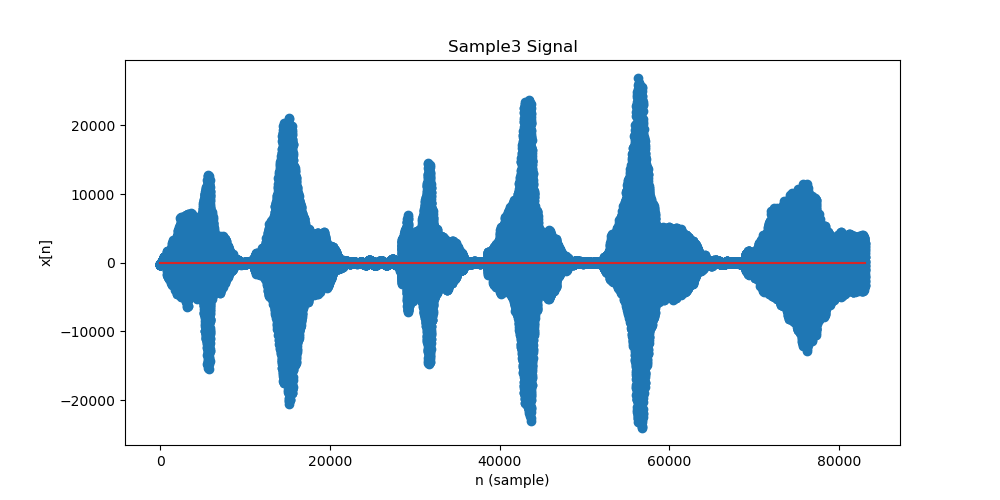

Text(0, 0.5, 'x[n]')

In [21]:
index = 2
Fs[index], xn[index] = read("A19_Sample3.wav") # sinyal verisinin çekilmesi
N[index] = len(xn[index]) # örnek sayısının atanması
n[index] = np.arange(0,N[index]) # örnek indisinin atanması

# sinyalin dinlenebilmesi için ses oynatıcısı oluşturulması
print('Sample3 Signal')
display(Audio(xn[index], rate=Fs[index]))

# sinyalin çizdirilmesi
plt.figure()
plt.stem(n[index], xn[index], use_line_collection=True)
plt.title("Sample3 Signal")
plt.xlabel("n (sample)")
plt.ylabel("x[n]")

<IPython.core.display.Javascript object>


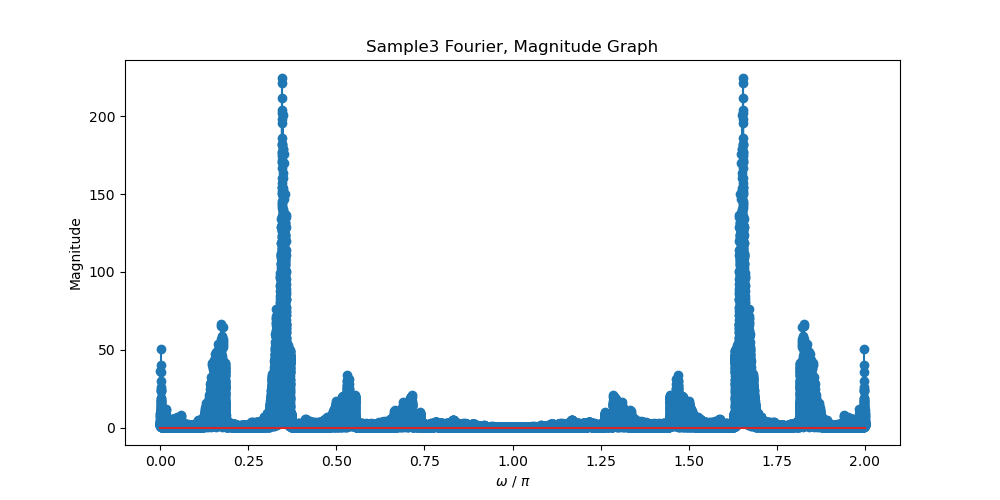

<IPython.core.display.Javascript object>


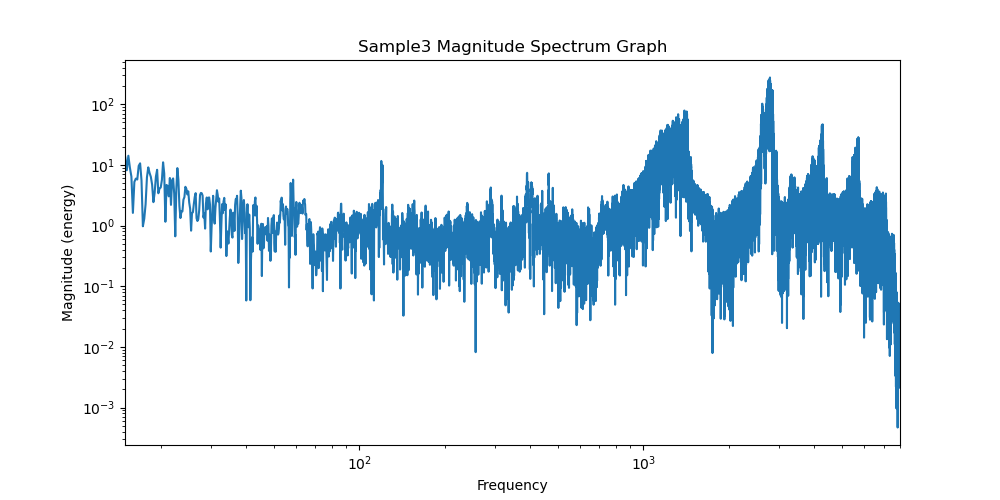

(15, 8000)

In [22]:
w[index] = np.arange(0, 2*np.pi, 2*np.pi/(N[index])) # açısal frekans indisinin hesaplanması
wf[index] = w[index]/np.pi*Fs[index]/2 # frekans indisinin hesaplanması
xw[index] = (np.fft.fft(xn[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.stem((w[index]/np.pi), abs(xw[index]), use_line_collection=True)
plt.title('Sample3 Fourier, Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.magnitude_spectrum(xn[index], Fs=Fs[index])
plt.title('Sample3 Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)

<IPython.core.display.Javascript object>


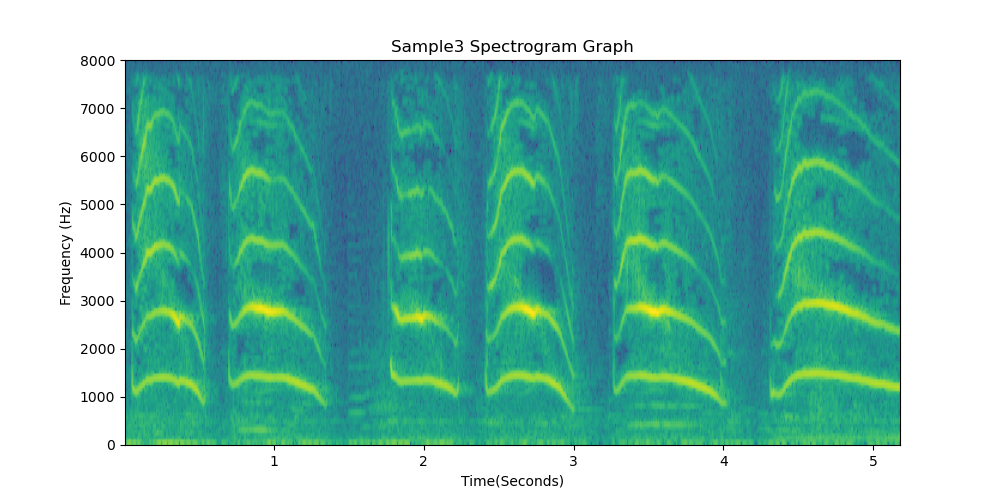

Text(0, 0.5, 'Frequency (Hz)')

In [23]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.specgram(xn[index],  Fs=int(Fs[index]))
plt.title('Sample3 Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')

In [24]:
NAvg[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg[index] = np.average(wf[index][:NAvg[index]], weights=abs(xw[index][:NAvg[index]])) # ağırlıklı ortalama frekans hesaplanması
print("Average Weighted Frequency: %5.2f" % (FreqAvg[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg[index] = np.average(abs(xw[index][:NAvg[index]])) # ortalama genlik hesaplanması
print("Average Magnitude: %5.2f" % (MagAvg[index])) # ortalama genlik değerinin yazdırılması

Average Weighted Frequency: 2977.92
Average Magnitude:  5.18


***

## Sample3 için Filtreleme İşlemleri <a class="anchor" id="Sample3F"></a>

<IPython.core.display.Javascript object>


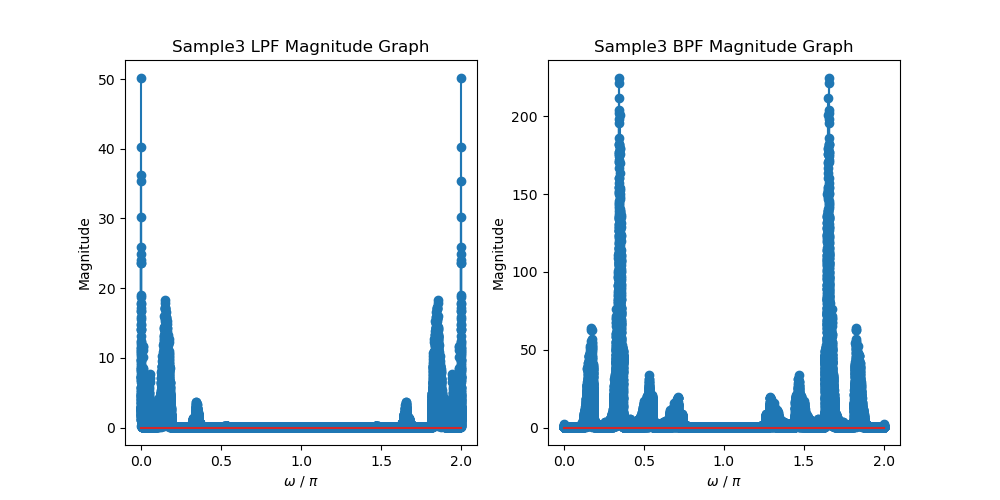

<IPython.core.display.Javascript object>


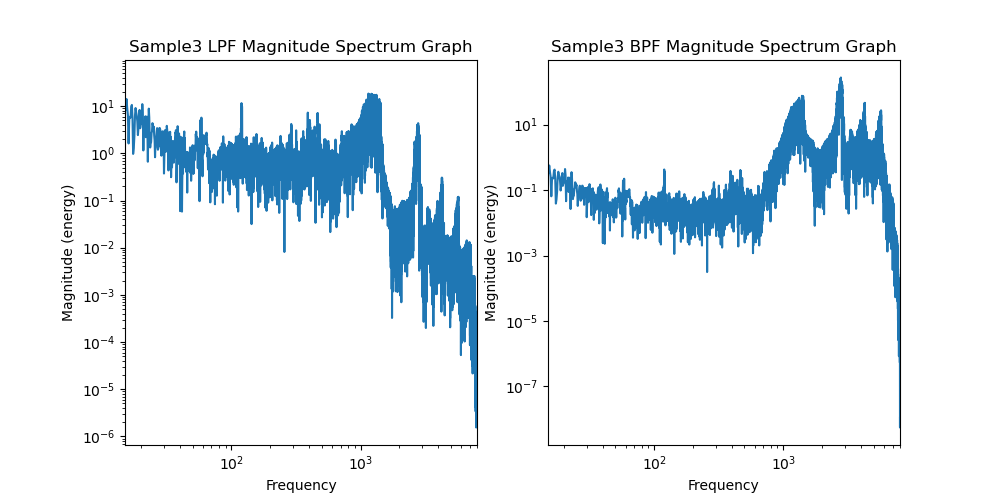

In [25]:
# işarete alçak geçiren filtrenin uygulanması
xn_LPF[index] = sgnl.lfilter(LPFb, LPFa, xn[index])
xw_LPF[index] = (np.fft.fft(xn_LPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# işarete bant geçiren filtrenin uygulanması
xn_BPF[index] = sgnl.lfilter(BPFb, BPFa, xn[index])
xw_BPF[index] = (np.fft.fft(xn_BPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.stem((w[index]/np.pi), abs(xw_LPF[index]), use_line_collection=True)
plt.title('Sample3 LPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.subplot(1,2,2)
plt.stem((w[index]/np.pi), abs(xw_BPF[index]), use_line_collection=True)
plt.title('Sample3 BPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.show()

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.magnitude_spectrum(xn_LPF[index], Fs=Fs[index])
plt.title('Sample3 LPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.subplot(1,2,2)
plt.magnitude_spectrum(xn_BPF[index], Fs=Fs[index])
plt.title('Sample3 BPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.show()

<IPython.core.display.Javascript object>


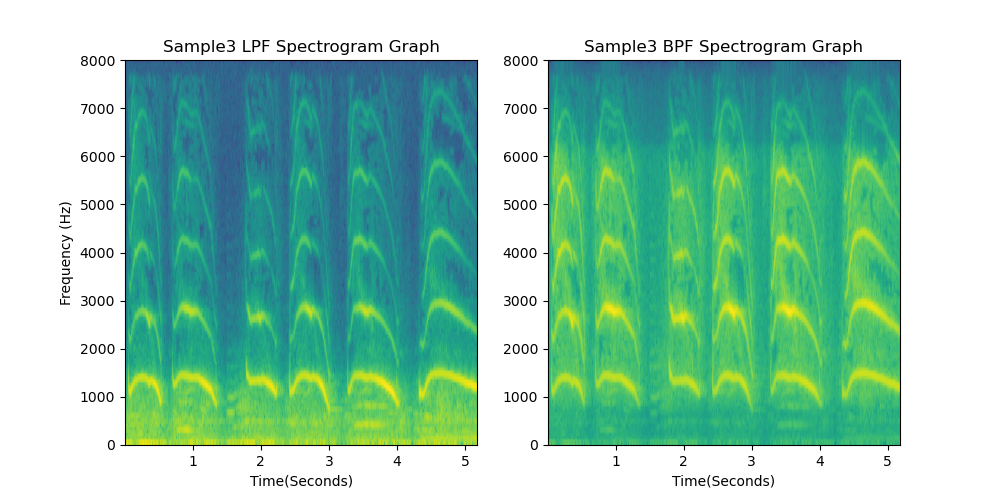

In [26]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.specgram(xn_LPF[index], Fs=int(Fs[index]))
plt.title('Sample3 LPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')
plt.subplot(1,2,2)
plt.specgram(xn_BPF[index], Fs=int(Fs[index]))
plt.title('Sample3 BPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.show()

In [27]:
NAvg_LPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_LPF[index] = np.average(wf[index][:NAvg_LPF[index]], weights=abs(xw_LPF[index][:NAvg_LPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("LPF Average Weighted Frequency: %5.2f" % (FreqAvg_LPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

NAvg_BPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_BPF[index] = np.average(wf[index][:NAvg_BPF[index]], weights=abs(xw_BPF[index][:NAvg_BPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("BPF Average Weighted Frequency: %5.2f" % (FreqAvg_BPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg_LPF[index] = np.average(abs(xw_LPF[index][:NAvg_LPF[index]])) # ortalama genlik hesaplanması
print("LPF Average Magnitude: %5.2f" % (MagAvg_LPF[index])) # ortalama genlik değerinin yazdırılması

MagAvg_BPF[index] = np.average(abs(xw_BPF[index][:NAvg_BPF[index]])) # ortalama genlik hesaplanması
print("BPF Average Magnitude: %5.2f" % (MagAvg_BPF[index])) # ortalama genlik değerinin yazdırılması

LPF Average Weighted Frequency: 1177.10
BPF Average Weighted Frequency: 2918.67
LPF Average Magnitude:  0.52
BPF Average Magnitude:  4.79


***

## Sample4 <a class="anchor" id="Sample4"></a>

Sample4 Signal


<IPython.core.display.Javascript object>


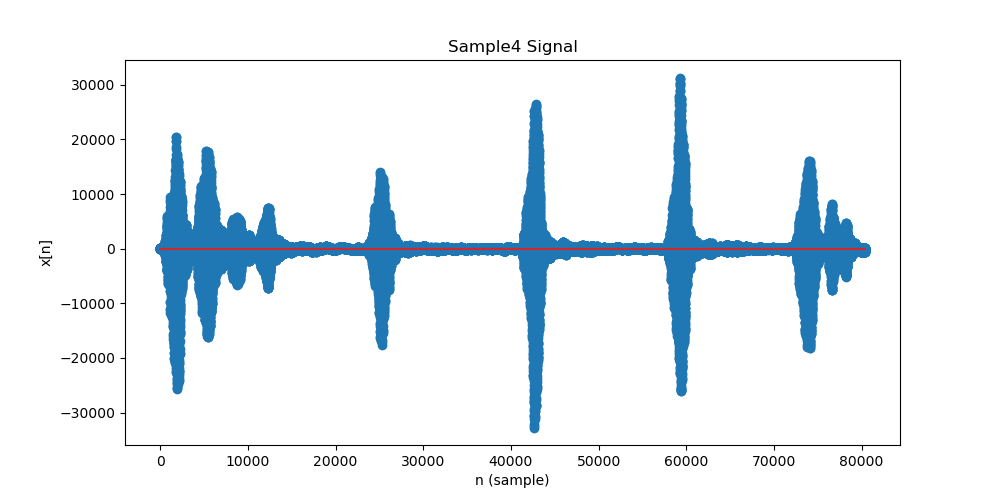

Text(0, 0.5, 'x[n]')

In [28]:
index = 3
Fs[index], xn[index] = read("A19_Sample4.wav") # sinyal verisinin çekilmesi
N[index] = len(xn[index]) # örnek sayısının atanması
n[index] = np.arange(0,N[index]) # örnek indisinin atanması

# sinyalin dinlenebilmesi için ses oynatıcısı oluşturulması
print('Sample4 Signal')
display(Audio(xn[index], rate=Fs[index]))

# sinyalin çizdirilmesi
plt.figure()
plt.stem(n[index], xn[index], use_line_collection=True)
plt.title("Sample4 Signal")
plt.xlabel("n (sample)")
plt.ylabel("x[n]")

<IPython.core.display.Javascript object>


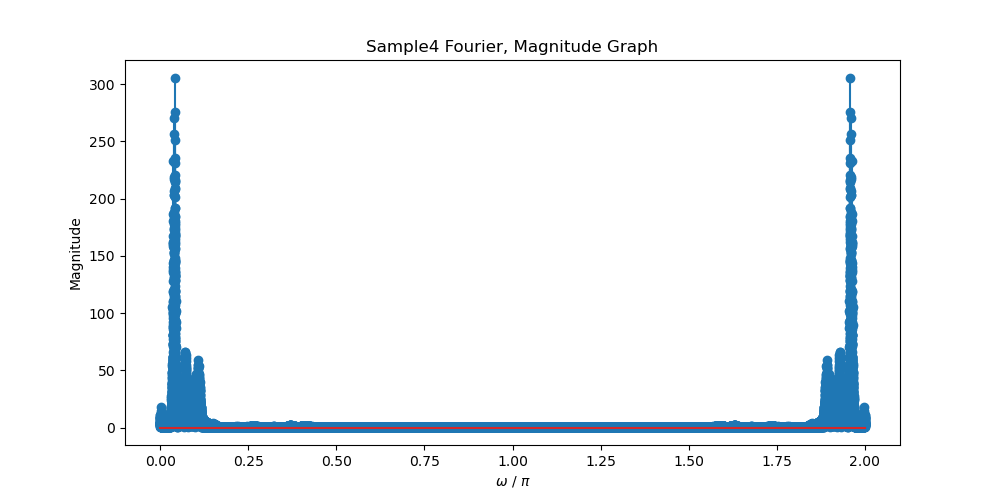

<IPython.core.display.Javascript object>


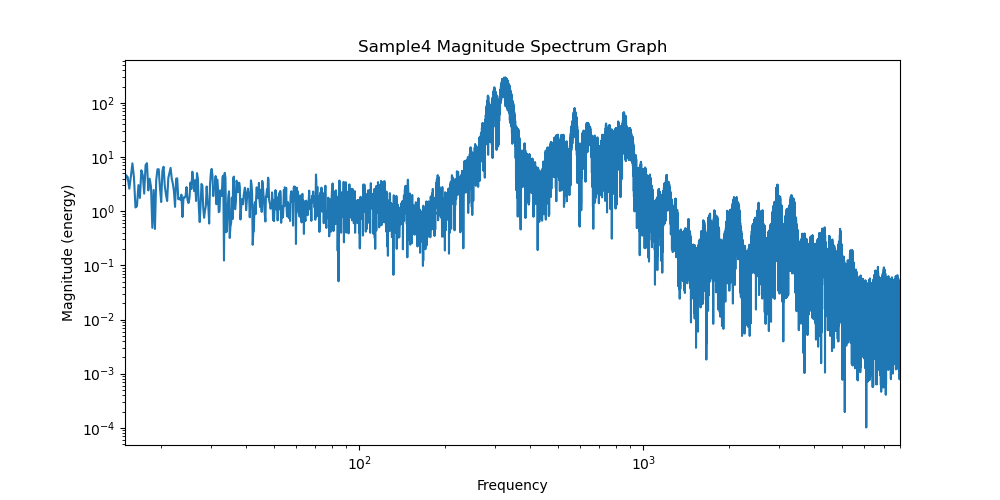

(15, 8000)

In [29]:
w[index] = np.arange(0, 2*np.pi, 2*np.pi/(N[index])) # açısal frekans indisinin hesaplanması
wf[index] = w[index]/np.pi*Fs[index]/2 # frekans indisinin hesaplanması
xw[index] = (np.fft.fft(xn[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.stem((w[index]/np.pi), abs(xw[index]), use_line_collection=True)
plt.title('Sample4 Fourier, Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.magnitude_spectrum(xn[index], Fs=Fs[index])
plt.title('Sample4 Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)

<IPython.core.display.Javascript object>


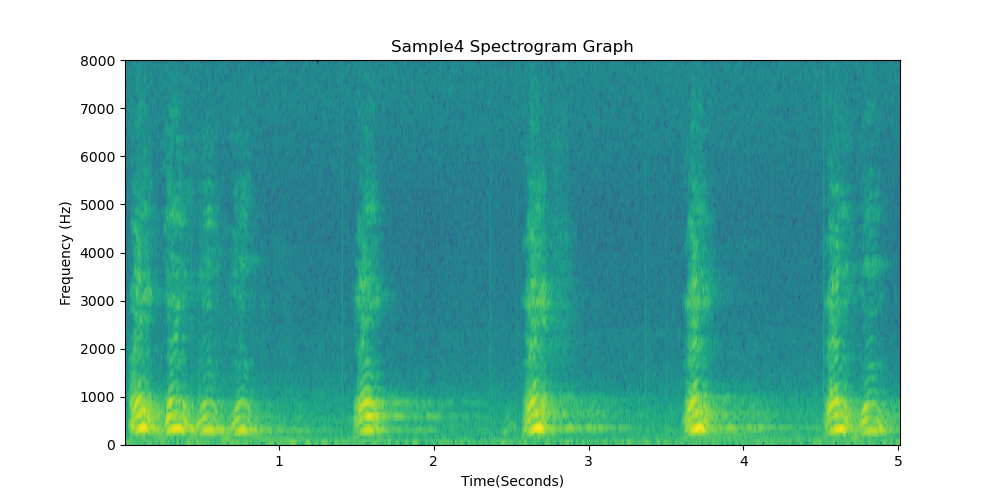

Text(0, 0.5, 'Frequency (Hz)')

In [30]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.specgram(xn[index],  Fs=int(Fs[index]))
plt.title('Sample4 Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')

In [31]:
NAvg[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg[index] = np.average(wf[index][:NAvg[index]], weights=abs(xw[index][:NAvg[index]])) # ağırlıklı ortalama frekans hesaplanması
print("Average Weighted Frequency: %5.2f" % (FreqAvg[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg[index] = np.average(abs(xw[index][:NAvg[index]])) # ortalama genlik hesaplanması
print("Average Magnitude: %5.2f" % (MagAvg[index])) # ortalama genlik değerinin yazdırılması

Average Weighted Frequency: 656.98
Average Magnitude:  2.37


***

## Sample4 için Filtreleme İşlemleri <a class="anchor" id="Sample4F"></a>

<IPython.core.display.Javascript object>


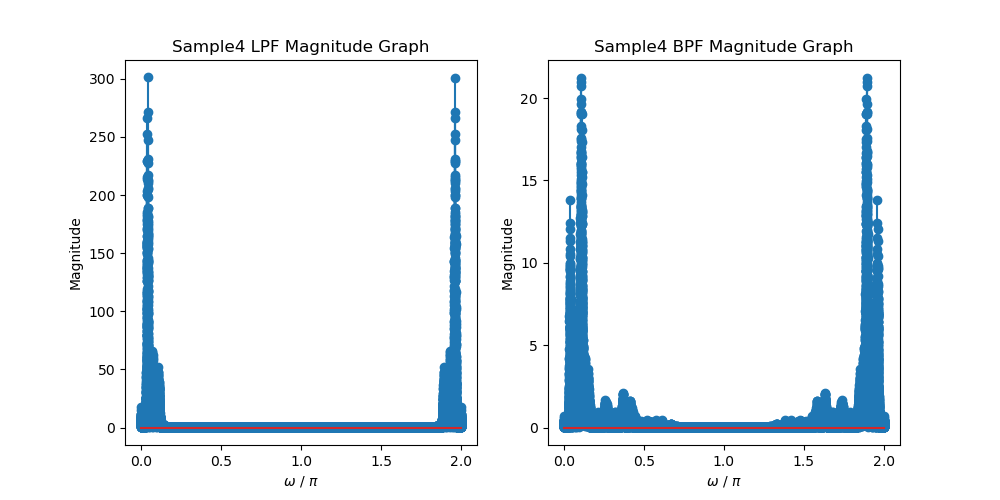

<IPython.core.display.Javascript object>


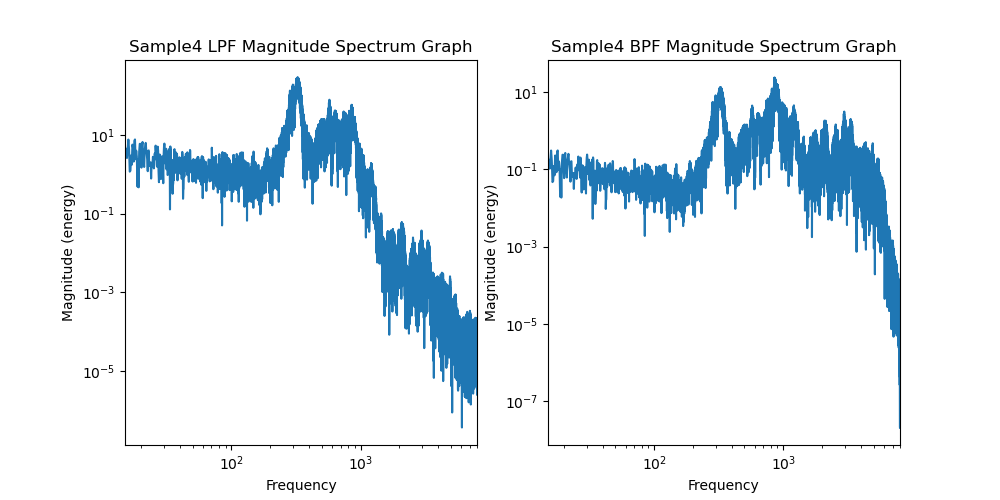

In [32]:
# işarete alçak geçiren filtrenin uygulanması
xn_LPF[index] = sgnl.lfilter(LPFb, LPFa, xn[index])
xw_LPF[index] = (np.fft.fft(xn_LPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# işarete bant geçiren filtrenin uygulanması
xn_BPF[index] = sgnl.lfilter(BPFb, BPFa, xn[index])
xw_BPF[index] = (np.fft.fft(xn_BPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.stem((w[index]/np.pi), abs(xw_LPF[index]), use_line_collection=True)
plt.title('Sample4 LPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.subplot(1,2,2)
plt.stem((w[index]/np.pi), abs(xw_BPF[index]), use_line_collection=True)
plt.title('Sample4 BPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.show()

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.magnitude_spectrum(xn_LPF[index], Fs=Fs[index])
plt.title('Sample4 LPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.subplot(1,2,2)
plt.magnitude_spectrum(xn_BPF[index], Fs=Fs[index])
plt.title('Sample4 BPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.show()

<IPython.core.display.Javascript object>


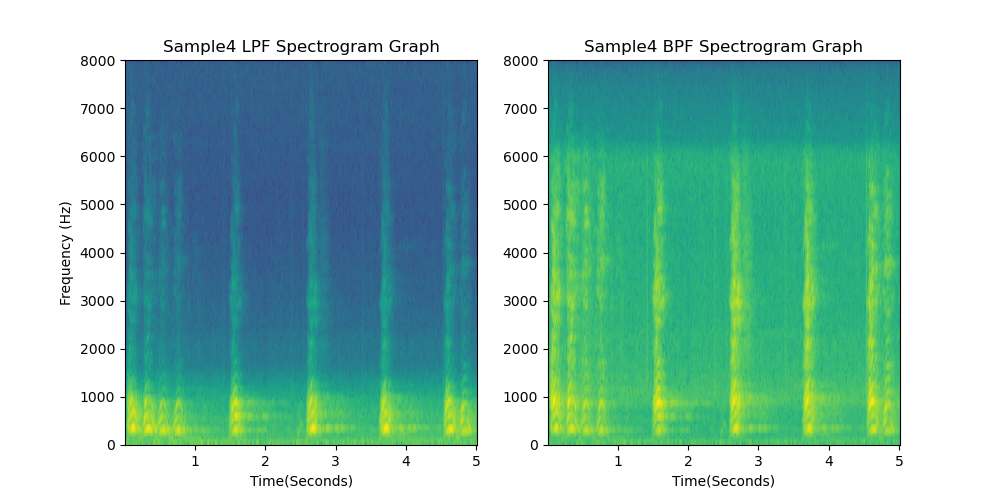

In [33]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.specgram(xn_LPF[index], Fs=int(Fs[index]))
plt.title('Sample4 LPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')
plt.subplot(1,2,2)
plt.specgram(xn_BPF[index], Fs=int(Fs[index]))
plt.title('Sample4 BPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.show()

In [34]:
NAvg_LPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_LPF[index] = np.average(wf[index][:NAvg_LPF[index]], weights=abs(xw_LPF[index][:NAvg_LPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("LPF Average Weighted Frequency: %5.2f" % (FreqAvg_LPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

NAvg_BPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_BPF[index] = np.average(wf[index][:NAvg_BPF[index]], weights=abs(xw_BPF[index][:NAvg_BPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("BPF Average Weighted Frequency: %5.2f" % (FreqAvg_BPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg_LPF[index] = np.average(abs(xw_LPF[index][:NAvg_LPF[index]])) # ortalama genlik hesaplanması
print("LPF Average Magnitude: %5.2f" % (MagAvg_LPF[index])) # ortalama genlik değerinin yazdırılması

MagAvg_BPF[index] = np.average(abs(xw_BPF[index][:NAvg_BPF[index]])) # ortalama genlik hesaplanması
print("BPF Average Magnitude: %5.2f" % (MagAvg_BPF[index])) # ortalama genlik değerinin yazdırılması

LPF Average Weighted Frequency: 505.67
BPF Average Weighted Frequency: 1431.01
LPF Average Magnitude:  2.14
BPF Average Magnitude:  0.42


***

## Sample5 <a class="anchor" id="Sample5"></a>

Sample5 Signal


<IPython.core.display.Javascript object>


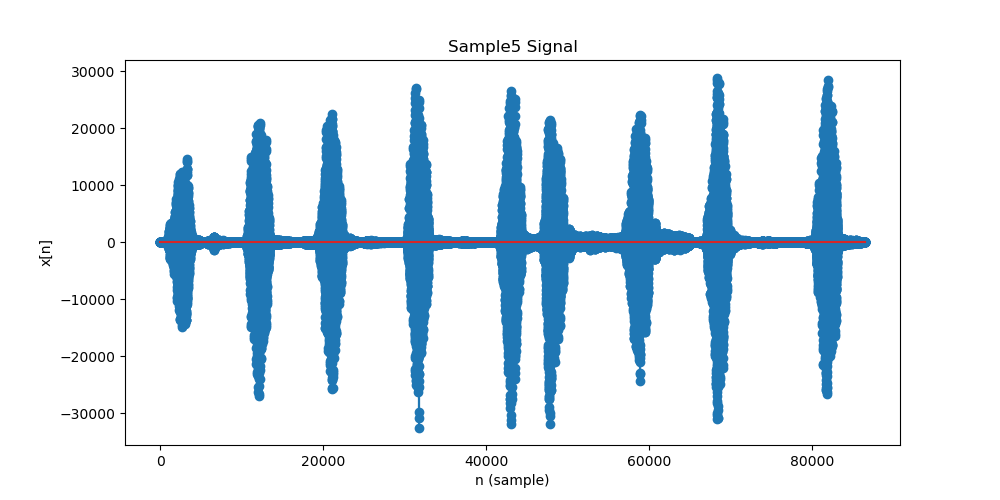

Text(0, 0.5, 'x[n]')

In [35]:
index = 4
Fs[index], xn[index] = read("A19_Sample5.wav") # sinyal verisinin çekilmesi
N[index] = len(xn[index]) # örnek sayısının atanması
n[index] = np.arange(0,N[index]) # örnek indisinin atanması

# sinyalin dinlenebilmesi için ses oynatıcısı oluşturulması
print('Sample5 Signal')
display(Audio(xn[index], rate=Fs[index]))

# sinyalin çizdirilmesi
plt.figure()
plt.stem(n[index], xn[index], use_line_collection=True)
plt.title("Sample5 Signal")
plt.xlabel("n (sample)")
plt.ylabel("x[n]")

<IPython.core.display.Javascript object>


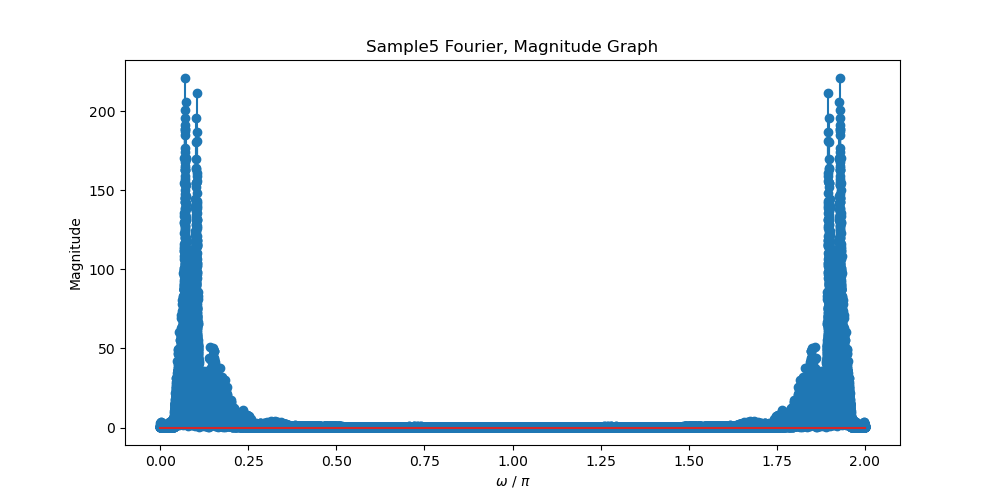

<IPython.core.display.Javascript object>


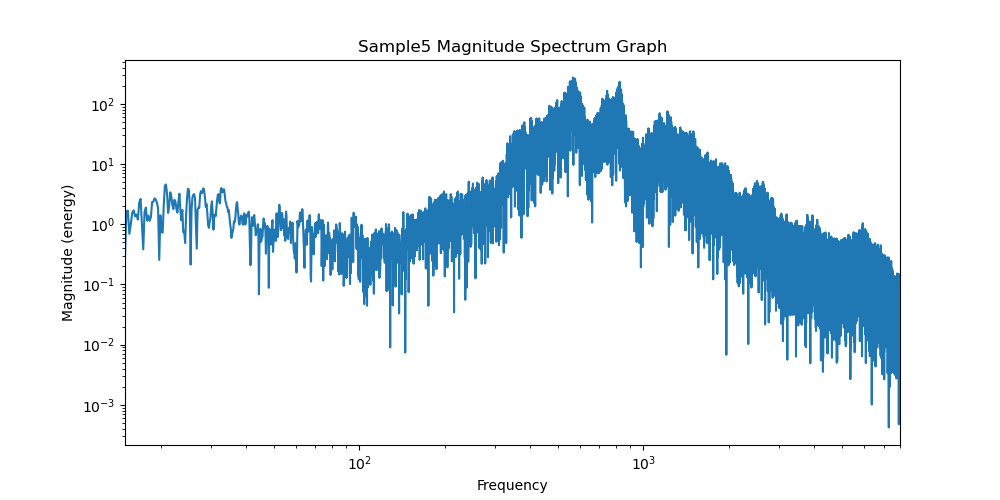

(15, 8000)

In [36]:
w[index] = np.arange(0, 2*np.pi, 2*np.pi/(N[index])) # açısal frekans indisinin hesaplanması
wf[index] = w[index]/np.pi*Fs[index]/2 # frekans indisinin hesaplanması
xw[index] = (np.fft.fft(xn[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.stem((w[index]/np.pi), abs(xw[index]), use_line_collection=True)
plt.title('Sample5 Fourier, Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.magnitude_spectrum(xn[index], Fs=Fs[index])
plt.title('Sample5 Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)

<IPython.core.display.Javascript object>


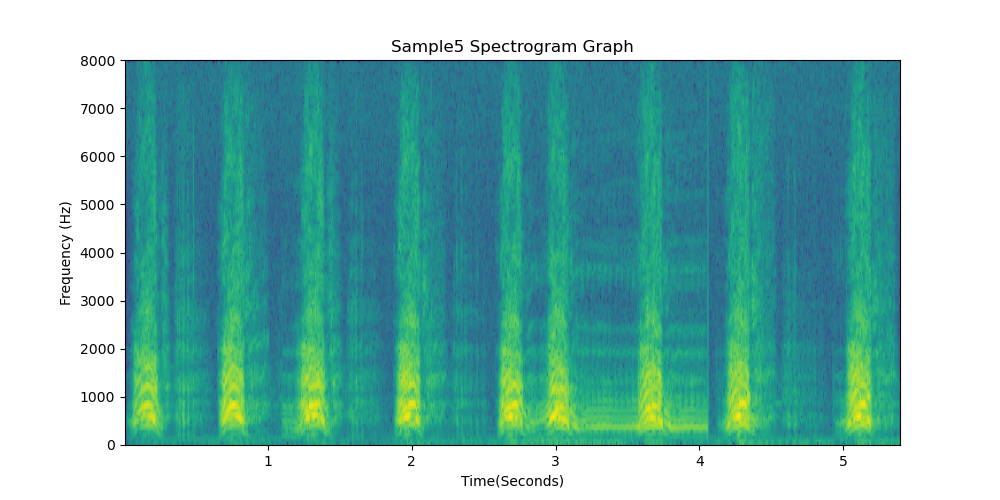

Text(0, 0.5, 'Frequency (Hz)')

In [37]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.specgram(xn[index],  Fs=int(Fs[index]))
plt.title('Sample5 Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')

In [38]:
NAvg[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg[index] = np.average(wf[index][:NAvg[index]], weights=abs(xw[index][:NAvg[index]])) # ağırlıklı ortalama frekans hesaplanması
print("Average Weighted Frequency: %5.2f" % (FreqAvg[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg[index] = np.average(abs(xw[index][:NAvg[index]])) # ortalama genlik hesaplanması
print("Average Magnitude: %5.2f" % (MagAvg[index])) # ortalama genlik değerinin yazdırılması

Average Weighted Frequency: 1017.44
Average Magnitude:  4.41


***

## Sample5 için Filtreleme İşlemleri <a class="anchor" id="Sample5F"></a>

<IPython.core.display.Javascript object>


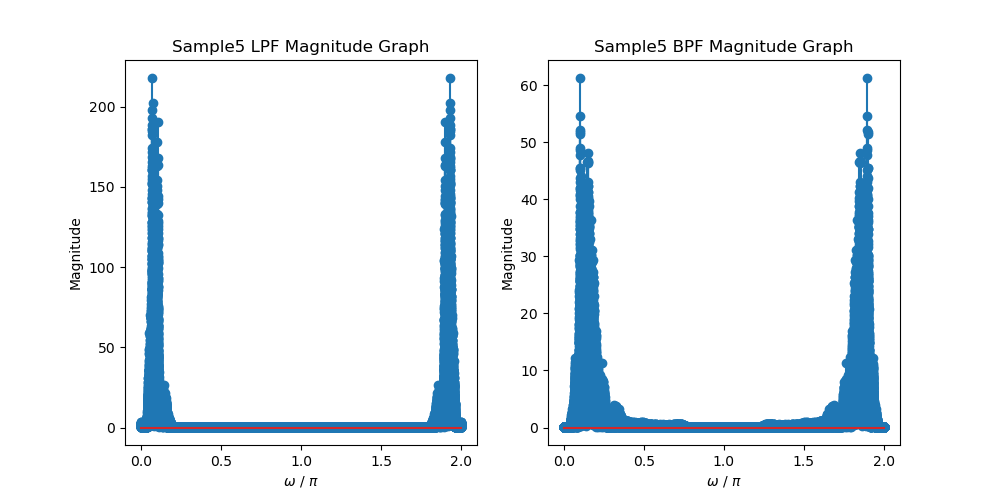

<IPython.core.display.Javascript object>


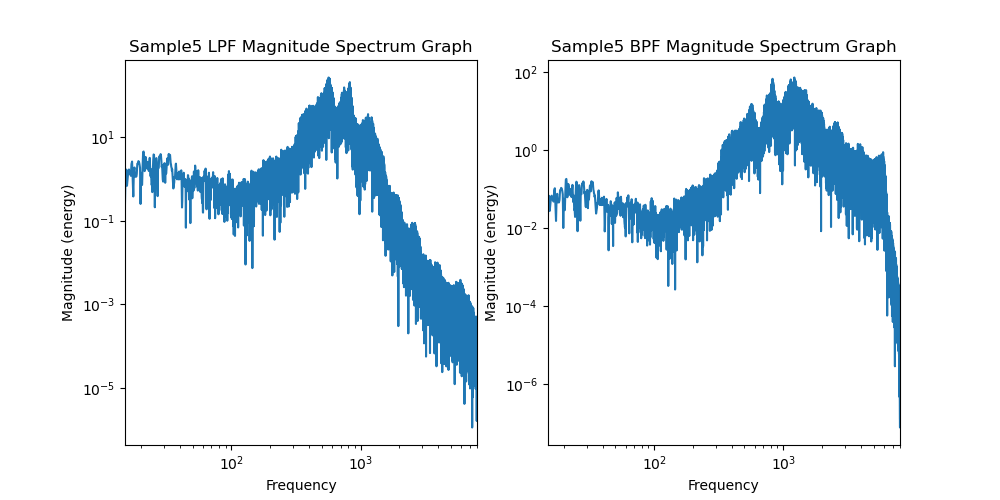

In [39]:
# işarete alçak geçiren filtrenin uygulanması
xn_LPF[index] = sgnl.lfilter(LPFb, LPFa, xn[index])
xw_LPF[index] = (np.fft.fft(xn_LPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# işarete bant geçiren filtrenin uygulanması
xn_BPF[index] = sgnl.lfilter(BPFb, BPFa, xn[index])
xw_BPF[index] = (np.fft.fft(xn_BPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.stem((w[index]/np.pi), abs(xw_LPF[index]), use_line_collection=True)
plt.title('Sample5 LPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.subplot(1,2,2)
plt.stem((w[index]/np.pi), abs(xw_BPF[index]), use_line_collection=True)
plt.title('Sample5 BPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.show()

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.magnitude_spectrum(xn_LPF[index], Fs=Fs[index])
plt.title('Sample5 LPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.subplot(1,2,2)
plt.magnitude_spectrum(xn_BPF[index], Fs=Fs[index])
plt.title('Sample5 BPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.show()

<IPython.core.display.Javascript object>


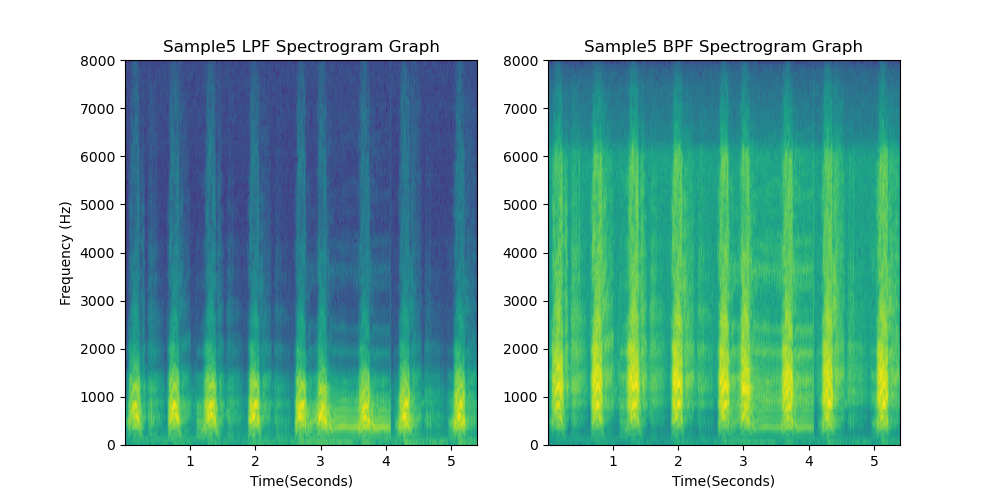

In [40]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.specgram(xn_LPF[index], Fs=int(Fs[index]))
plt.title('Sample5 LPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')
plt.subplot(1,2,2)
plt.specgram(xn_BPF[index], Fs=int(Fs[index]))
plt.title('Sample5 BPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.show()

In [41]:
NAvg_LPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_LPF[index] = np.average(wf[index][:NAvg_LPF[index]], weights=abs(xw_LPF[index][:NAvg_LPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("LPF Average Weighted Frequency: %5.2f" % (FreqAvg_LPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

NAvg_BPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_BPF[index] = np.average(wf[index][:NAvg_BPF[index]], weights=abs(xw_BPF[index][:NAvg_BPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("BPF Average Weighted Frequency: %5.2f" % (FreqAvg_BPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg_LPF[index] = np.average(abs(xw_LPF[index][:NAvg_LPF[index]])) # ortalama genlik hesaplanması
print("LPF Average Magnitude: %5.2f" % (MagAvg_LPF[index])) # ortalama genlik değerinin yazdırılması

MagAvg_BPF[index] = np.average(abs(xw_BPF[index][:NAvg_BPF[index]])) # ortalama genlik hesaplanması
print("BPF Average Magnitude: %5.2f" % (MagAvg_BPF[index])) # ortalama genlik değerinin yazdırılması

LPF Average Weighted Frequency: 713.91
BPF Average Weighted Frequency: 1459.83
LPF Average Magnitude:  3.16
BPF Average Magnitude:  1.83


***

## Sample6 <a class="anchor" id="Sample6"></a>

Sample6 Signal


<IPython.core.display.Javascript object>


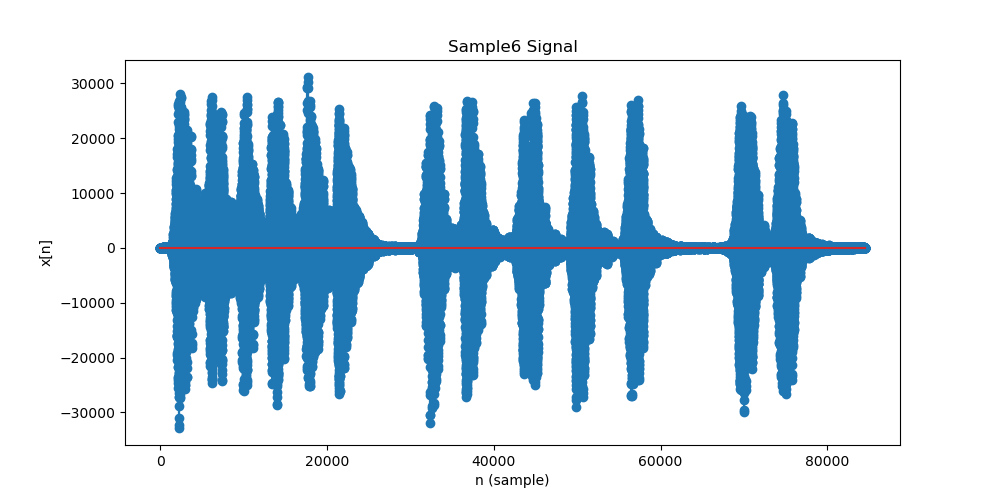

Text(0, 0.5, 'x[n]')

In [42]:
index = 5
Fs[index], xn[index] = read("A19_Sample6.wav") # sinyal verisinin çekilmesi
N[index] = len(xn[index]) # örnek sayısının atanması
n[index] = np.arange(0,N[index]) # örnek indisinin atanması

# sinyalin dinlenebilmesi için ses oynatıcısı oluşturulması
print('Sample6 Signal')
display(Audio(xn[index], rate=Fs[index]))

# sinyalin çizdirilmesi
plt.figure()
plt.stem(n[index], xn[index], use_line_collection=True)
plt.title("Sample6 Signal")
plt.xlabel("n (sample)")
plt.ylabel("x[n]")

<IPython.core.display.Javascript object>


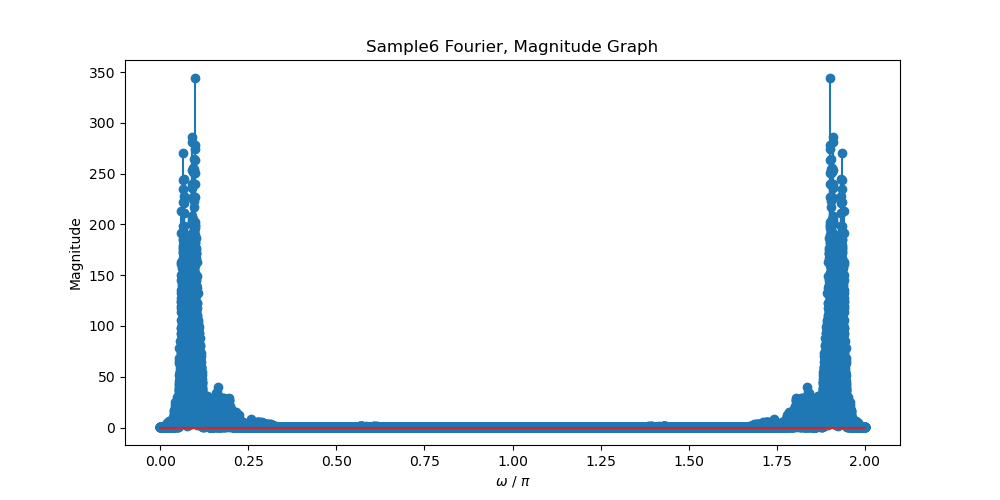

<IPython.core.display.Javascript object>


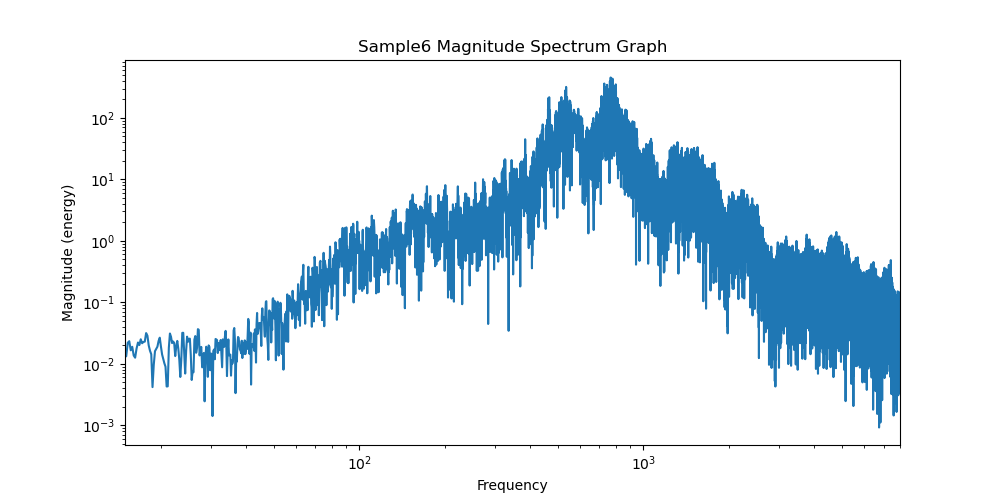

(15, 8000)

In [43]:
w[index] = np.arange(0, 2*np.pi, 2*np.pi/(N[index])) # açısal frekans indisinin hesaplanması
wf[index] = w[index]/np.pi*Fs[index]/2 # frekans indisinin hesaplanması
xw[index] = (np.fft.fft(xn[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.stem((w[index]/np.pi), abs(xw[index]), use_line_collection=True)
plt.title('Sample6 Fourier, Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.magnitude_spectrum(xn[index], Fs=Fs[index])
plt.title('Sample6 Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)

<IPython.core.display.Javascript object>


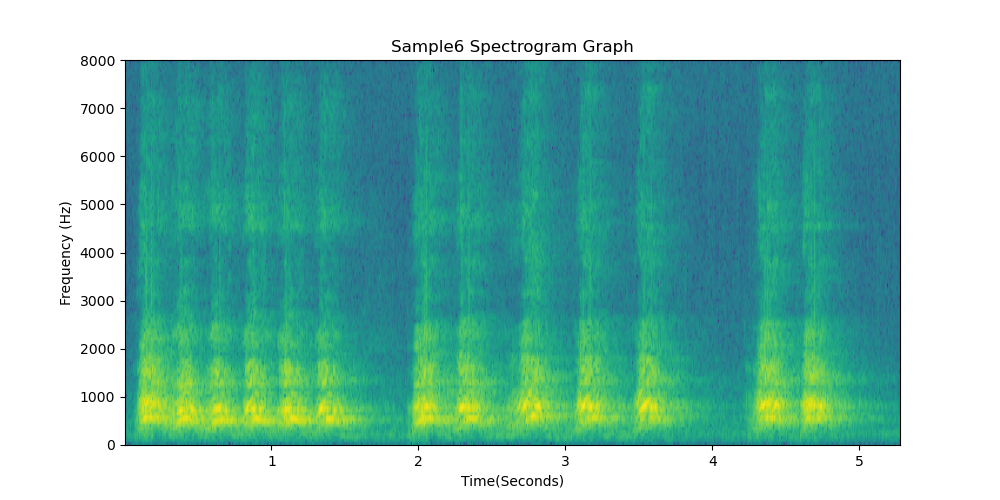

Text(0, 0.5, 'Frequency (Hz)')

In [44]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.specgram(xn[index],  Fs=int(Fs[index]))
plt.title('Sample6 Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')

In [45]:
NAvg[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg[index] = np.average(wf[index][:NAvg[index]], weights=abs(xw[index][:NAvg[index]])) # ağırlıklı ortalama frekans hesaplanması
print("Average Weighted Frequency: %5.2f" % (FreqAvg[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg[index] = np.average(abs(xw[index][:NAvg[index]])) # ortalama genlik hesaplanması
print("Average Magnitude: %5.2f" % (MagAvg[index])) # ortalama genlik değerinin yazdırılması

Average Weighted Frequency: 915.61
Average Magnitude:  5.32


***

## Sample6 için Filtreleme İşlemleri <a class="anchor" id="Sample6F"></a>

<IPython.core.display.Javascript object>


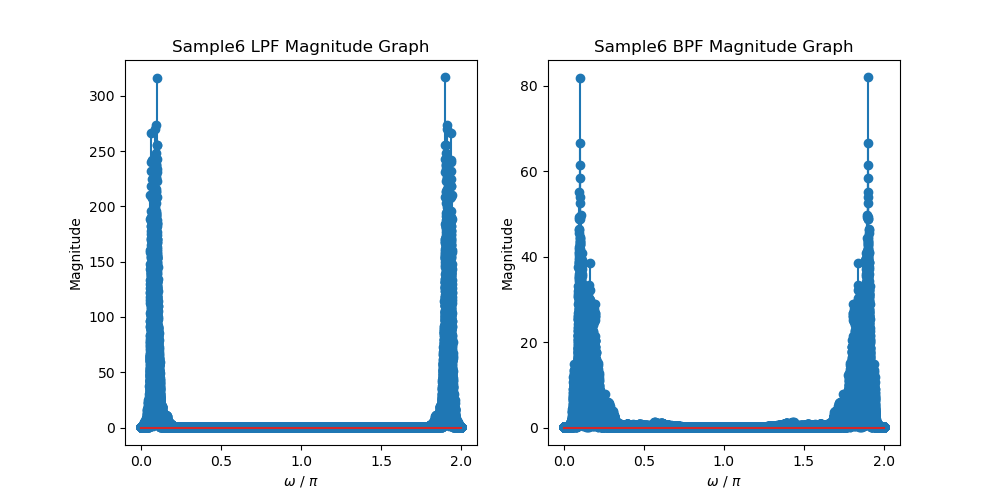

<IPython.core.display.Javascript object>


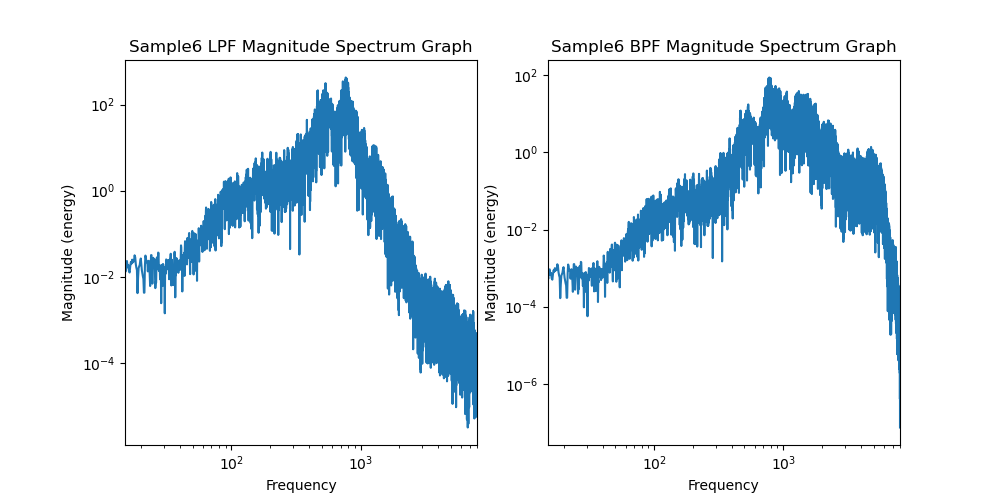

In [46]:
# işarete alçak geçiren filtrenin uygulanması
xn_LPF[index] = sgnl.lfilter(LPFb, LPFa, xn[index])
xw_LPF[index] = (np.fft.fft(xn_LPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# işarete bant geçiren filtrenin uygulanması
xn_BPF[index] = sgnl.lfilter(BPFb, BPFa, xn[index])
xw_BPF[index] = (np.fft.fft(xn_BPF[index], (N[index]))/(N[index])) # fourier dönüşümünün alınması

# fourier grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.stem((w[index]/np.pi), abs(xw_LPF[index]), use_line_collection=True)
plt.title('Sample6 LPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.subplot(1,2,2)
plt.stem((w[index]/np.pi), abs(xw_BPF[index]), use_line_collection=True)
plt.title('Sample6 BPF Magnitude Graph')
plt.xlabel('$\omega$ / $\pi$')
plt.ylabel('Magnitude')
plt.show()

# genlik spektrum grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.magnitude_spectrum(xn_LPF[index], Fs=Fs[index])
plt.title('Sample6 LPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.subplot(1,2,2)
plt.magnitude_spectrum(xn_BPF[index], Fs=Fs[index])
plt.title('Sample6 BPF Magnitude Spectrum Graph')
plt.xscale('log')
plt.yscale('log')
plt.xlim(15, 8000)
plt.show()

<IPython.core.display.Javascript object>


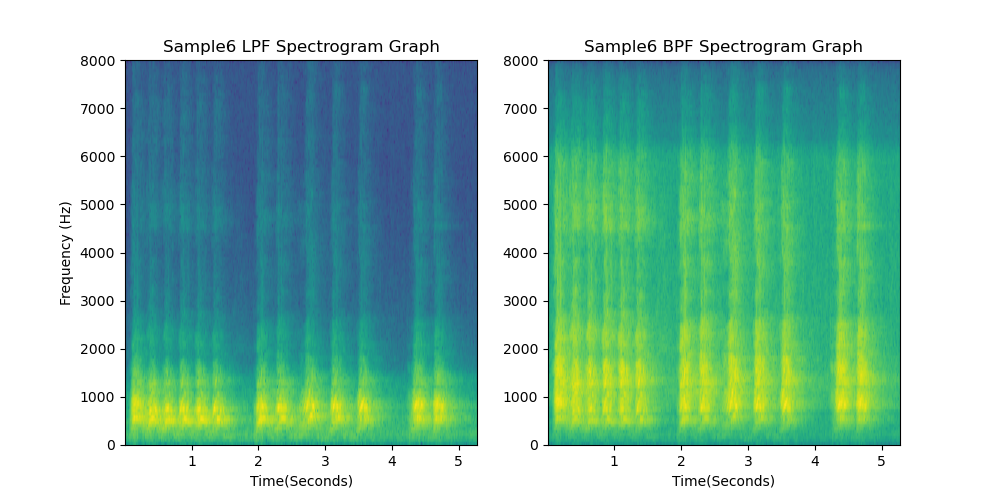

In [47]:
# spektogram grafiğinin çizdirilmesi
plt.figure()
plt.subplot(1,2,1)
plt.specgram(xn_LPF[index], Fs=int(Fs[index]))
plt.title('Sample6 LPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.ylabel('Frequency (Hz)')
plt.subplot(1,2,2)
plt.specgram(xn_BPF[index], Fs=int(Fs[index]))
plt.title('Sample6 BPF Spectrogram Graph')
plt.xlabel('Time(Seconds)')
plt.show()

In [48]:
NAvg_LPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_LPF[index] = np.average(wf[index][:NAvg_LPF[index]], weights=abs(xw_LPF[index][:NAvg_LPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("LPF Average Weighted Frequency: %5.2f" % (FreqAvg_LPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

NAvg_BPF[index] = int((N[index]-1)/2) # ortalama örnek sayısının hesaplanması
FreqAvg_BPF[index] = np.average(wf[index][:NAvg_BPF[index]], weights=abs(xw_BPF[index][:NAvg_BPF[index]])) # ağırlıklı ortalama frekans hesaplanması
print("BPF Average Weighted Frequency: %5.2f" % (FreqAvg_BPF[index])) # ağırlıklı ortalama frekans değerinin yazdırılması

MagAvg_LPF[index] = np.average(abs(xw_LPF[index][:NAvg_LPF[index]])) # ortalama genlik hesaplanması
print("LPF Average Magnitude: %5.2f" % (MagAvg_LPF[index])) # ortalama genlik değerinin yazdırılması

MagAvg_BPF[index] = np.average(abs(xw_BPF[index][:NAvg_BPF[index]])) # ortalama genlik hesaplanması
print("BPF Average Magnitude: %5.2f" % (MagAvg_BPF[index])) # ortalama genlik değerinin yazdırılması

LPF Average Weighted Frequency: 703.32
BPF Average Weighted Frequency: 1366.00
LPF Average Magnitude:  4.22
BPF Average Magnitude:  1.73


***

***

# Decision Algorithm <a class="anchor" id="Algorithm"></a>

In [49]:
difference_LPF = np.empty([6])
difference_BPF = np.empty([6])
for i in range(6):
    index = i
    difference_LPF[index] = MagAvg[index] - MagAvg_LPF[index]
    difference_BPF[index] = MagAvg[index] - MagAvg_BPF[index]
    if difference_LPF[index] > difference_BPF[index]:
        print('Sample%d is a cat' % (index+1))
    elif difference_BPF[index] > difference_LPF[index]:
        print('Sample%d is a dog' % (index+1))
    else:
        print('Sample%d cannot be decided' % (index+1))

Sample1 is a cat
Sample2 is a cat
Sample3 is a cat
Sample4 is a dog
Sample5 is a dog
Sample6 is a dog
